# Customer Transaction Prediction

###  1. BUSINESS CASE: Based On Given Features of Dataset we need to Predict Which Customer make a transaction in the future irrespective of the amount of Money Transacted

## TASK:BINARY CLASSIFICATION TASK

### Importing the  libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
from scipy import stats

import gc
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_curve
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.model_selection import cross_val_score


from sklearn.decomposition import PCA 
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import xgboost
from xgboost import XGBClassifier


from sklearn.utils import class_weight
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif



In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
#Loading the data
data = pd.read_csv('Transaction.csv')

# Domain analysis
Provided with an anonymized dataset containing numeric feature variables,

The binary target column, and a string ID_code column.

The task is to predict the value of target column.

### Basic Checks

In [58]:
data.head()


,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697

In [59]:
data.tail()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,-0.6209,5.6669,3.7574,-9.5348,13.9860,5.2982,8.2705,14.1527,7.4540,-5.0105,12.0465,8.6349,9.9137,25.1376,1.0914,3.2326,7.7802,13.9939,2.9085,0.1005,4.2369,7.5665,-9.2149,9.5746,1.4012,7.4211,11.0075,7.8080,4.5567,4.9861,9.7471,0.0722,5.9053,8.1743,10.8800,11.1665,4.2600,-2.1296,8.7833,-15.5727,-8.4916,22.1905,12.4110,15.1168,1.6041,6.1868,10.9576,18.7371,15.2986,5.7322,5.1244,9.8225,14.0315,-23.6064,-1.3403,-2.5577,6.3582,-5.4557,5.6063,7.0054,5.0171,-5.0055,28.9502,1.2297,4.4918,19.5568,20.8357,19.2136,17.6422,17.9836,4.0395,14.0761,-5.7878,16.3870,-14.1721,-13.0269,-2.5955,21.4526,15.6163,0.9845,8.2110,-0.8553,-12.1682,6.7779,7.3895,10.5084,15.5057,-0.6812,5.8999,6.1825,3.1038,-1.6930,-18.8473,9.9358,25.3359,1.3647,11.8509,5.0357,6.4630,18.4008,14.3787,19.0369,-0.6364,6.9155,3.6763,3.1460,4.9442,-1.8289,1.3521,34.6265,-0.6869,-5.3781,20.5030,10.9614,4.9677,6.1408,2.2575,12.8757,14.2253,-1.2868,0.2212,16.8661,12.7663,1.2414,7.1304,7.4108,-6.3369,3.0760,24.9796,20.3410,5.3312,23.7116,2.4745,11.2013,17.8165,13.0057,9.5506,5.3589,13.2491,-3.3068,3.6998,2.5927,14.3025,8.1596,7.9609,18.3343,4.3086,1.3546,12.4158,-5.3985,16.3683,10.4522,35.4923,5.5477,7.4244,12.5459,-6.7840,31.1895,2.6529,-11.1867,9.8865,5.4730,-5.3880,-0.4698,24.4025,-5.4493,11.3529,7.7075,-5.0491,13.0756,15.8271,3.3580,-14.3371,10.4421,7.6530,9.4585,22.7783,-4.0305,4.2233,-6.3906,13.5058,-0.4594,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,-3.6797,6.0019,6.5576,-11.8776,14.4131,3.3087,3.5800,14.1597,7.5191,-8.8715,17.9467,17.0237,6.6459,18.2345,0.8982,2.2532,15.4977,13.3282,5.2281,-3.7424,5.5144,5.7148,-13.7470,7.4369,1.3041,12.7552,12.5362,-1.1002,2.4370,6.2631,14.8565,-2.9862,-7.8820,7.1320,11.8869,11.4218,8.9282,-27.2007,14.5962,-19.8502,26.0775,24.3915,12.6910,10.2453,6.8173,4.5666,-9.5685,18.4685,16.9534,7.3660,4.7038,9.4559,6.0037,-10.8728,0.7859,4.7000,7.8077,-1.7926,6.1534,12.9087,5.0398,-0.4247,22.6256,0.7166,0.6533,13.5821,20.3267,25.5380,14.0155,17.3326,4.2046,14.0195,11.4812,17.9954,-18.3549,-3.4537,1.1233,22.3135,1.9795,16.0239,4.7492,0.2446,-39.6406,6.9473,9.9392,11.1977,14.1006,-0.8012,18.8214,32.9827,1.7989,-0.2476,-15.5294,9.5501,11.8548,1.5127,11.3998,4.2304,6.6777,11.3434,14.2993,13.1205,13.3224,7.3143,3.6817,9.7780,4.0491,2.7221,4.4344,3.7648,2.1927,-2.9197,23.0679,12.2112,

In [60]:
data.sample()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
136000,train_136000,0,11.628,-5.3877,8.635,3.2646,11.6415,1.9312,4.6147,11.3627,1.8048,7.2347,-2.2074,-1.1716,14.1194,8.4902,6.0918,14.31,7.357,0.8142,19.375,8.3368,8.023,6.6939,2.9357,2.4449,9.9407,13.3453,-0.1706,-2.8899,5.2636,7.3075,-6.7952,10.5025,0.5857,7.9018,12.6434,5.3538,-0.996,4.5081,5.0007,0.3276,-1.0259,0.6728,12.1589,11.5432,9.1483,-32.5315,13.115,-9.3343,22.2865,4.6031,13.1058,13.6334,1.6576,6.3504,0.4219,15.4462,18.7571,6.4542,0.7058,10.4442,4.2609,-3.2169,2.5375,4.6526,7.1172,-0.6282,5.4037,17.7426,5.0089,1.081,33.0906,0.657,-2.8201,17.0071,-1.2161,19.0233,11.0324,14.5705,8.8154,14.8125,10.584,10.614,-10.7303,6.9546,2.3307,14.5763,9.4004,13.7274,7.4787,3.103,-21.9806,6.9636,18.1513,10.8239,9.993,-0.1441,7.7791,42.2445,2.447,-1.3335,-9.5536,11.1126,25.7562,1.4756,11.2901,2.8903,9.1244,24.9023,14.0957,18.6988,1.5408,8.1216,3.6827,9.8397,2.5836,0.8429,-0.187,32.7588,-3.4972,12.2404,49.0981,11.2445,-3.0044,13.7385,2.0134,12.3937,14.9496,-3.2272,2.2371,14.0986,12.2754,0.8737,7.2444,7.6003,-6.6238,-4.7703,31.5408,20.6918,8.2396,13.1416,4.2194,-6.1604,17.5795,12.7685,8.2104,-1.792,8.4518,-10.6272,3.6294,4.8768,20.656,18.2531,3.9259,17.745,7.6784,6.2618,12.1387,5.8256,14.5879,11.3235,46.1235,5.3308,7.8625,17.5911,1.7608,21.9327,3.7816,-6.486,5.0078,5.4515,4.8156,-1.3625,27.6704,0.1442,8.3676,14.1667,0.4111,13.8193,-7.6797,0.0624,2.7964,9.685,-10.6987,9.883,24.9392,-4.5978,4.4955,-13.8725,19.346,1.8209,7.561,8.8698,1.5576,-1.8749,22.8583,-1.7419,-0.004,8.9713,19.5846,13.7364


In [61]:
data.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,2000

In [62]:
data.isnull().sum()

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
var_3      0
var_4      0
var_5      0
var_6      0
var_7      0
var_8      0
var_9      0
var_10     0
var_11     0
var_12     0
var_13     0
var_14     0
var_15     0
var_16     0
var_17     0
var_18     0
var_19     0
var_20     0
var_21     0
var_22     0
var_23     0
var_24     0
var_25     0
var_26     0
var_27     0
var_28     0
var_29     0
var_30     0
var_31     0
var_32     0
var_33     0
var_34     0
var_35     0
var_36     0
var_37     0
var_38     0
var_39     0
var_40     0
var_41     0
var_42     0
var_43     0
var_44     0
var_45     0
var_46     0
var_47     0
var_48     0
var_49     0
var_50     0
var_51     0
var_52     0
var_53     0
var_54     0
var_55     0
var_56     0
var_57     0
var_58     0
var_59     0
var_60     0
var_61     0
var_62     0
var_63     0
var_64     0
var_65     0
var_66     0
var_67     0
var_68     0
var_69     0
var_70     0
var_71     0
var_72     0
var_73     0
var_74     0

In [10]:
data.value_counts().sum()

200000

In [11]:
data.shape

(200000, 202)

In [28]:
data.columns

Index(['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4',
       'var_5', 'var_6', 'var_7',
       ...
       'var_190', 'var_191', 'var_192', 'var_193', 'var_194', 'var_195',
       'var_196', 'var_197', 'var_198', 'var_199'],
      dtype='object', length=202)

In [25]:
print(data.columns.tolist())

['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4', 'var_5', 'var_6', 'var_7', 'var_8', 'var_9', 'var_10', 'var_11', 'var_12', 'var_13', 'var_14', 'var_15', 'var_16', 'var_17', 'var_18', 'var_19', 'var_20', 'var_21', 'var_22', 'var_23', 'var_24', 'var_25', 'var_26', 'var_27', 'var_28', 'var_29', 'var_30', 'var_31', 'var_32', 'var_33', 'var_34', 'var_35', 'var_36', 'var_37', 'var_38', 'var_39', 'var_40', 'var_41', 'var_42', 'var_43', 'var_44', 'var_45', 'var_46', 'var_47', 'var_48', 'var_49', 'var_50', 'var_51', 'var_52', 'var_53', 'var_54', 'var_55', 'var_56', 'var_57', 'var_58', 'var_59', 'var_60', 'var_61', 'var_62', 'var_63', 'var_64', 'var_65', 'var_66', 'var_67', 'var_68', 'var_69', 'var_70', 'var_71', 'var_72', 'var_73', 'var_74', 'var_75', 'var_76', 'var_77', 'var_78', 'var_79', 'var_80', 'var_81', 'var_82', 'var_83', 'var_84', 'var_85', 'var_86', 'var_87', 'var_88', 'var_89', 'var_90', 'var_91', 'var_92', 'var_93', 'var_94', 'var_95', 'var_96', 'var_97', 'var_98'

In [30]:
data.target.unique()

array([0, 1], dtype=int64)

In [31]:
data.nunique()

ID_code    200000
target          2
var_0       94672
var_1      108932
var_2       86555
var_3       74597
var_4       63515
var_5      141029
var_6       38599
var_7      103063
var_8       98617
var_9       49417
var_10     128764
var_11     130193
var_12       9561
var_13     115181
var_14      79122
var_15      19810
var_16      86918
var_17     137823
var_18     139515
var_19     144180
var_20     127764
var_21     140062
var_22      90660
var_23      24913
var_24     105101
var_25      14853
var_26     127089
var_27      60185
var_28      35859
var_29      88339
var_30     145977
var_31      77388
var_32      85964
var_33     112239
var_34      25164
var_35     122384
var_36      96404
var_37      79040
var_38     115366
var_39     112674
var_40     141878
var_41     131896
var_42      31592
var_43      15188
var_44     127702
var_45     169968
var_46      93450
var_47     154781
var_48     152039
var_49     140641
var_50      32308
var_51     143455
var_52     121313
var_53    

In [12]:
data.describe(include = 'O')

,ID_code
count,200000
unique,200000
top,train_0
freq,1


In [38]:
data.corr()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
target,1.000000,0.052390,0.050343,0.055870,0.011055,0.010915,0.030979,6.673085e-02,-0.003025,0.019584,-0.042805,-0.002213,0.022993,-6.948928e-02,-0.055156,-0.006332,0.017283,0.008117,0.000864,0.043479,0.011291,-0.018329,-0.058483,0.060558,-0.025473,0.028477,0.013328,0.062422,-5.818916e-04,-0.023942,0.004682,0.000638,-0.025619,0.030513,-0.044334,-0.052692,0.036567,-0.038397,0.007685,0.000970,-0.004090,0.049530,-0.001298,-0.008365,-0.028557,-4.903939e-02,-0.020065,0.005690,0.008983,0.032334,0.030612,-0.013900,0.025992,0.027754,0.063399,-0.015796,0.017176,-0.035000,-0.015468,-0.024277,-0.010448,0.006265,0.007407,0.013888,-0.014670,-0.013805,0.011214,0.023114,0.044673,-0.011957,0.008283,0.026748,0.033607,-0.013005,-0.006460,0.019926,-3.808113e-02,-0.061917,-0.017459,0.048245,0.007591,-0.057609,-0.080917,0.022574,-0.020528,0.012363,-0.024513,-0.039126,-0.035860,-0.020677,0.039369,0.029395,0.040127,-0.046295,-0.035070,0.046296,0.038531,0.003037,0.015224,-0.004074,0.058367,2.215327e-03,-0.009138,-0.018329,-0.001395,-0.026605,0.025604,0.032947,-0.039997,-0.044791,-4.992600e-02,0.064275,0.026686,0.023694,-0.013681,-0.026266,-0.050174,-2.344771e-02,0.002591,0.040358,0.030975,-0.010895,-0.039788,-0.042461,-0.040291,0.004218,0.028223,1.392930e-03,-0.039125,0.026909,-0.005880,0.029917,-0.032380,-0.024510,0.054548,0.017213,0.027944,-0.003554,0.027190,0.018328,-0.074080,0.015301,-0.029701,-1.890064e-02,-0.011202,2.120786e-02,0.030917,-0.063644,0.040280,-0.055011,-0.047319,-2.582110e-02,0.027524,-0.010773,-0.007103,-0.046106,0.037240,-0.020997,0.032642,-0.003817,0.015278,-0.005135,0.004168,0.032647,0.031811,0.040997,-0.055734,-0.057773,0.030797,0.014115,-0.048382,0.047973,0.014873,-0.037976,4.202224e-02,-0.061669,0.021692,0.007469,-3.686307e-02,-0.019681,0.050002,0.031190,1.371375e-02,-0.007198,-0.005467,0.048315,0.000053,-0.030421,0.014873,-0.034015,0.009212,0.055973,4.711368e-02,-0.042858,-0.017709,-0.022838,0.028285,0.023608,-0.035303,-0.053000,0.025434
var_0,0.052390,1.000000,-0.000544,0.006573,0.003801,0.001326,0.003046,6.982549e-03,0.002429,0.004962,-0.002613,0.000355,0.003468,-1.995731e-03,-0.002717,-0.004584,-0.000043,0.001112,-0.001664,0.004292,0.001505,-0.000932,0.000781,0.002322,-0.000987,0.003658,0.001158,0.006117,9.846974e-04,0.001081,-0.000426,0.003187,-0.002097,0.000274,-0.003343,-0.003933,0.001469,-0.002556,-0.000253,-0.000470,-0.001409,0.006798,0.001152,-0.000440,0.002685,-3.003208e-03,-0.001539,0.000129,0.004062,0.003767,0.000524,-0.004678,0.001217,0.00303

In [33]:
#Insights from basic checks.
#This dataset having 200000 rows and 202 columns
#The feature ID_code is a unique categorical feature.
#All other features are continous.
#Target having two unique values 0 and 1.Therefore it is a binary classification problem.
#There is no missing values.
#columns have high std (up to 20)
#columns have a high range of means.

# Exploratory data analysis

### Univariate analysis

Text(0.5, 1.0, 'Number of target values')

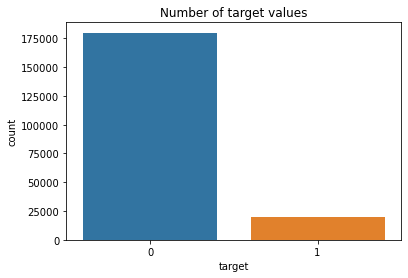

In [4]:
sns.countplot(data=data, x='target')
plt.title('Number of target values')

In [65]:
data.target.value_counts()

0    179902
1     20098
Name: target, dtype: int64

In [23]:
data['target'].value_counts(normalize=True)

0    0.89951
1    0.10049
Name: target, dtype: float64

In [15]:
#Data is highly imbalanced.
#target is binary . 10% of samples belong to 1 class;
#0 class has is more than 1

###### Dist plots of  features

In [43]:
gc.collect();
data.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,2000

In [44]:
numerical_features = data.columns[2:]

Distributions columns


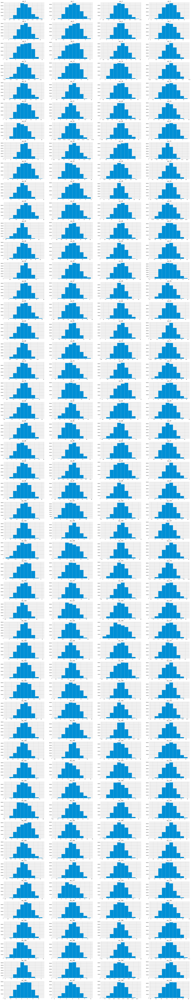

In [45]:
print('Distributions columns')
plt.figure(figsize=(30, 185))
for i, col in enumerate(numerical_features):
    plt.subplot(50, 4, i + 1)
    plt.hist(data[col]) 
    plt.title(col)
gc.collect();

Almost all features shows a normal distribution. Lets see the distributions for for all numerical features per each class.

Distributions columns


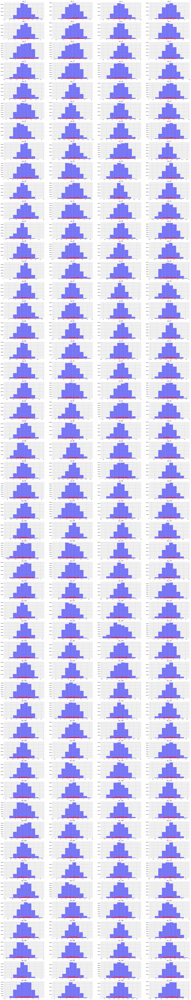

In [46]:
print('Distributions columns')
plt.figure(figsize=(30, 185))
for i, col in enumerate(numerical_features):
    plt.subplot(50, 4, i + 1)
    plt.hist(data[data["target"] == 0][col], alpha=0.5, label='0', color='b')
    plt.hist(data[data["target"] == 1][col], alpha=0.5, label='1', color='r')    
    plt.title(col)
gc.collect();

In [7]:
#aLL variables are normally distributed for 1 and 0 classess 

##### Histogram

In [8]:
##Distribution of all features.
def plot_feature_distribution(df1, df2, label1, label2, features):
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(10,10,figsize=(18,22))

    for feature in features:
        i += 1
        plt.subplot(10,10,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        plt.xlabel(feature, fontsize=9)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=6, pad=-6)
        plt.tick_params(axis='y', which='major', labelsize=6)
    plt.show();

<Figure size 432x288 with 0 Axes>

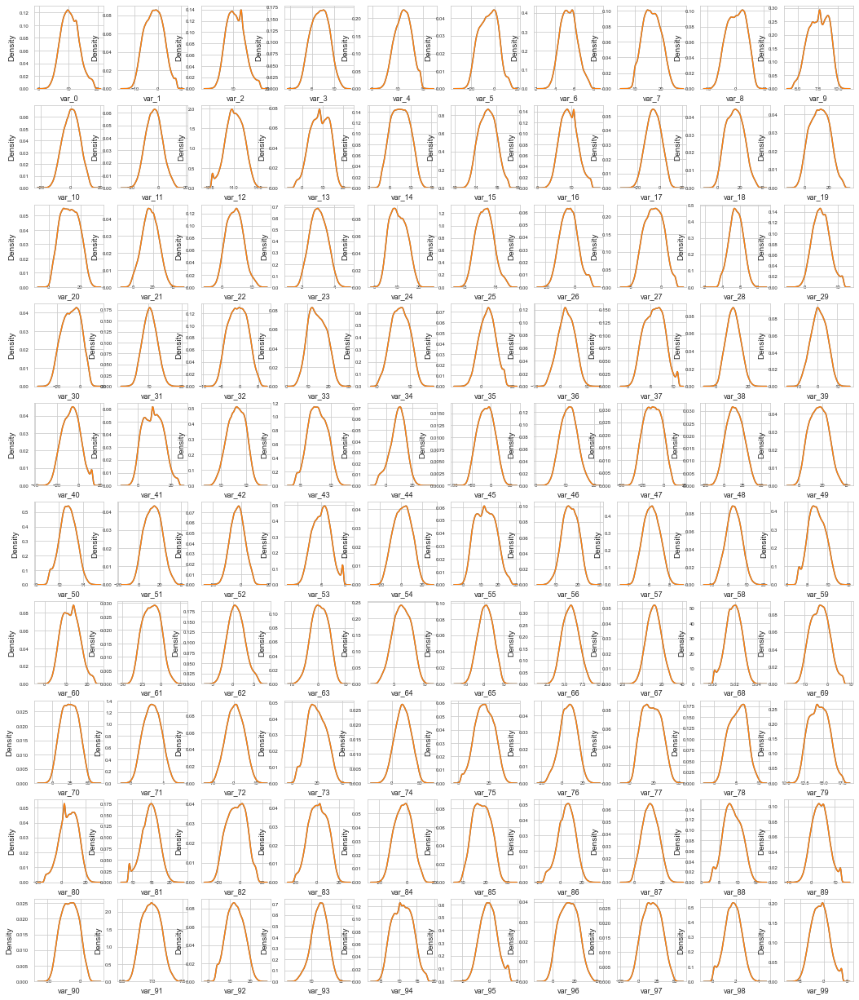

In [15]:
t0 = data.loc[data['target'] == 0]
t1 = data.loc[data['target'] == 1]
features = data.columns.values[2:102]
plot_feature_distribution(t0, t1, '0', '1', features)

<Figure size 432x288 with 0 Axes>

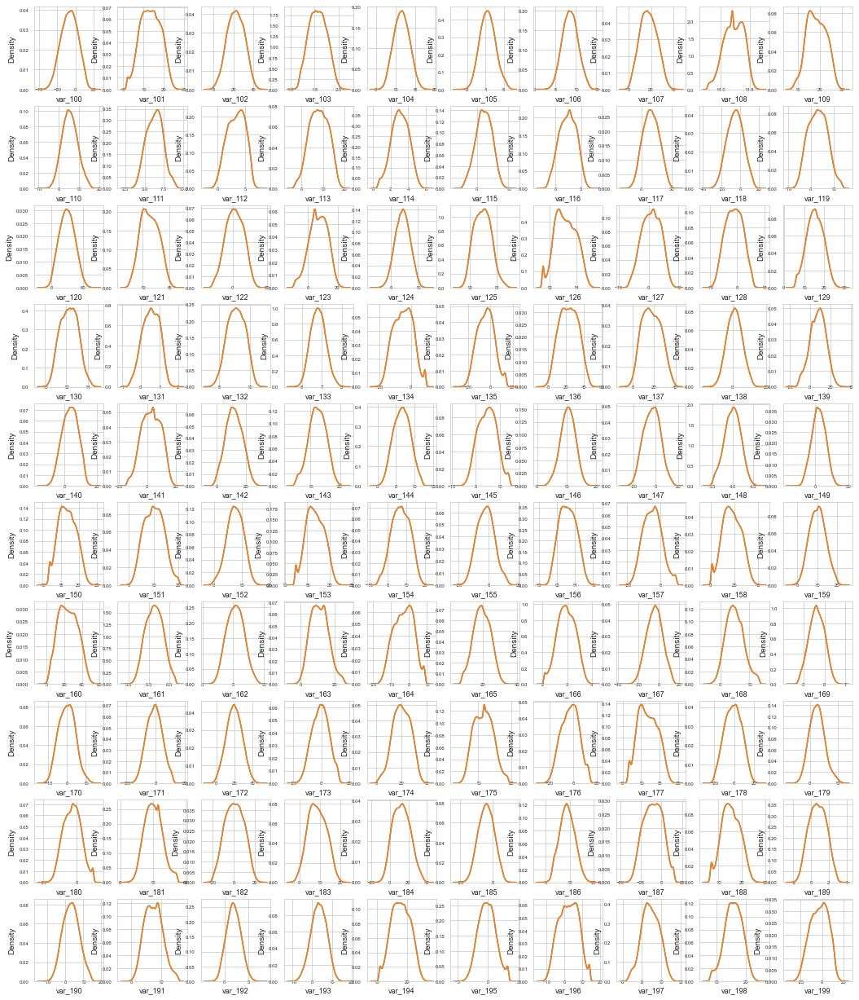

In [17]:
features = data.columns.values[102:202]
plot_feature_distribution(t0, t1, '0', '1', features)

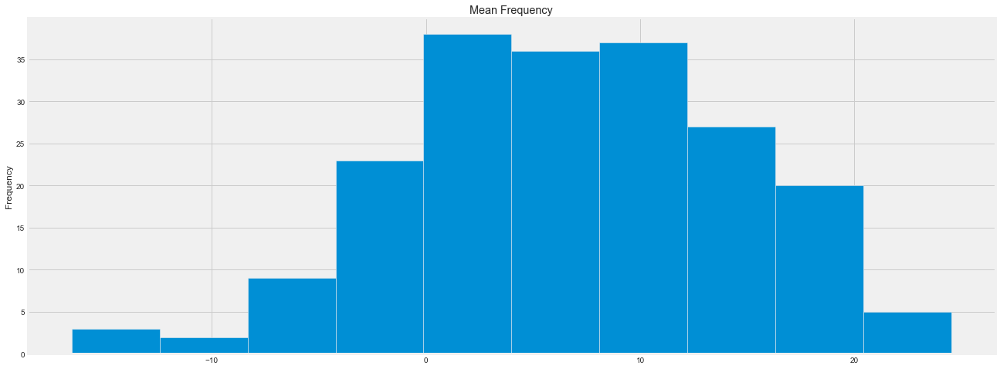

In [50]:
plt.figure(figsize=(20, 8))
data[numerical_features].mean().plot(kind = 'hist');
plt.title('Mean Frequency');

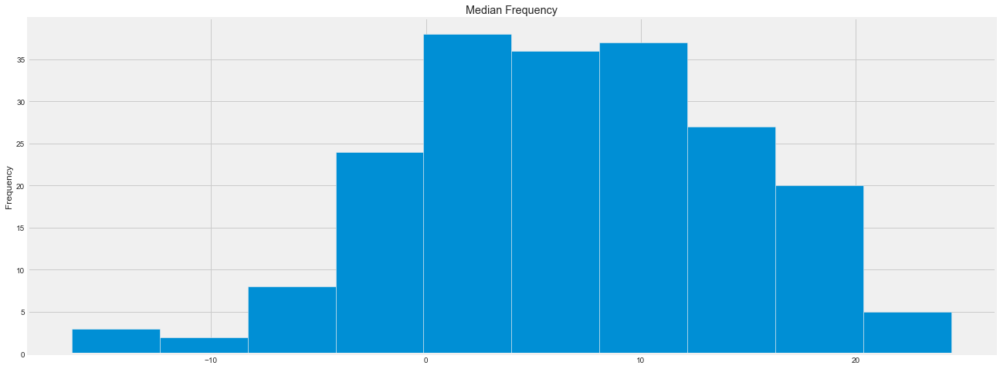

In [51]:
plt.figure(figsize=(20, 8))
data[numerical_features].median().plot(kind ='hist');
plt.title('Median Frequency');

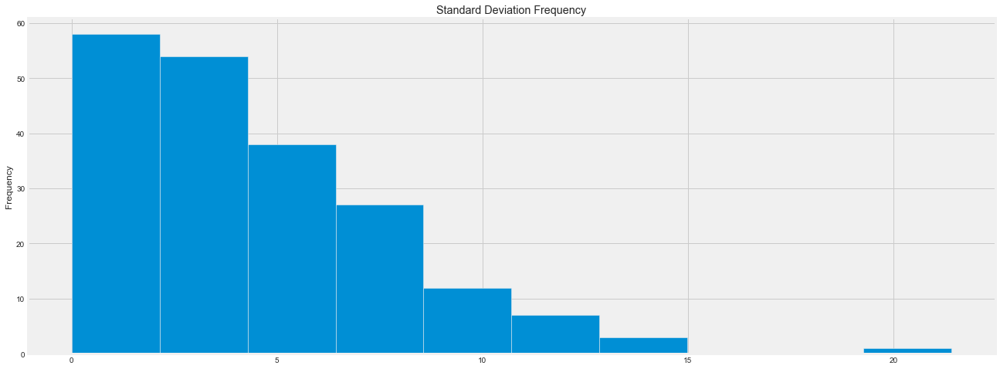

In [52]:
plt.figure(figsize=(20, 8))
data[numerical_features].std().plot(kind = 'hist');
plt.title('Standard Deviation Frequency');

Most of the distributions show small std. deviations, and very few more than 20.

## Bivariate Analysis

In [11]:
def plot_feature_distribution(df):
    plt.title("Distribution of all features")
    fig, axes = plt.subplots(20, 10, figsize=(20, 50))
    fig.subplots_adjust(hspace=1.01, wspace=0.1)

    for i, col in enumerate(df.columns[1:]):
        plt.subplot(20,10,i+1)
        sns.histplot(data=df, x=col, kde=True, hue='target')
        plt.tick_params(axis='both', left=False, bottom=False, labelleft=False)
        plt.ylabel('')

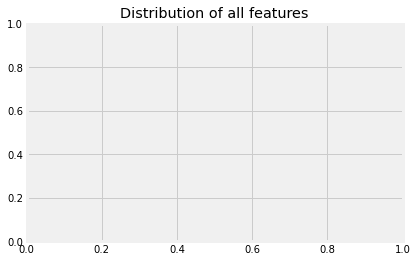

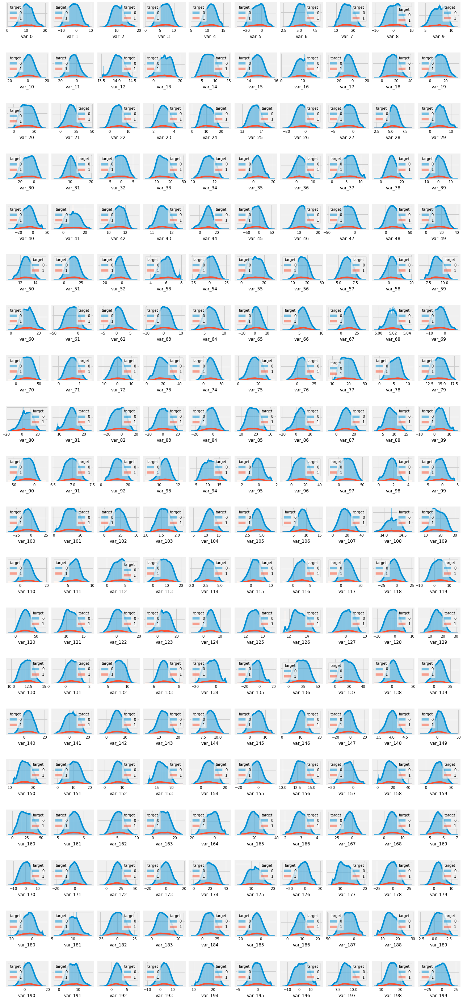

In [12]:
plot_feature_distribution(data)

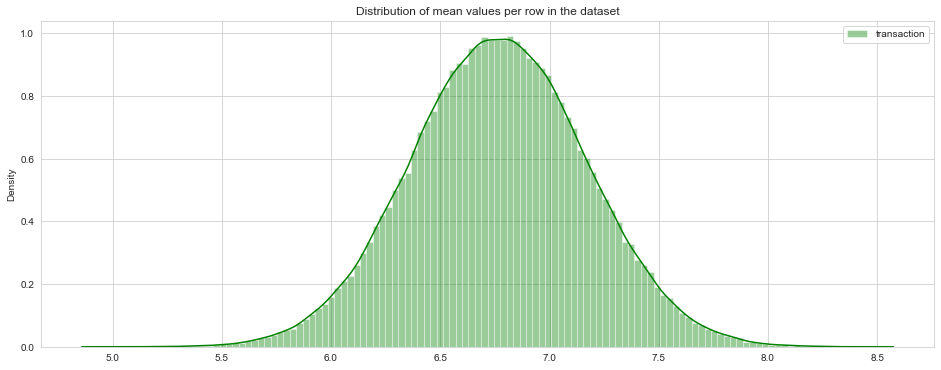

In [18]:
#Distribution of mean and std
plt.figure(figsize=(16,6))
features = data.columns.values[2:202]
plt.title("Distribution of mean values per row in the dataset")
sns.distplot(data[features].mean(axis=1),color="green", kde=True,bins=120, label='transaction')
plt.legend()
plt.show()

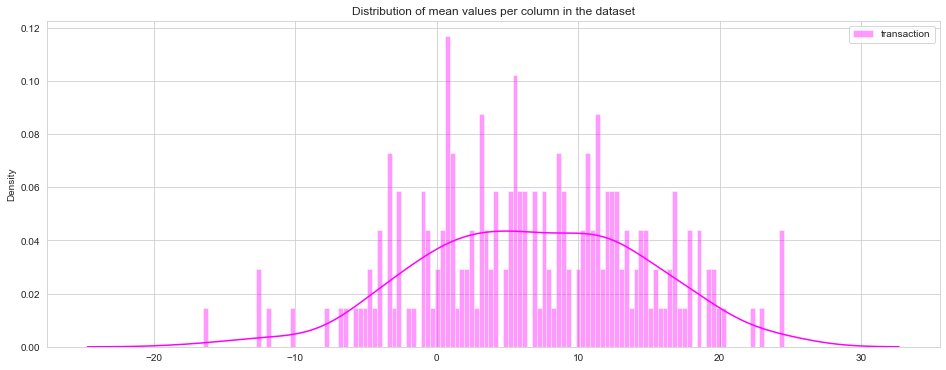

In [19]:
plt.figure(figsize=(16,6))
plt.title("Distribution of mean values per column in the dataset")
sns.distplot(data[features].mean(axis=0),color="magenta",kde=True,bins=120, label='transaction')
plt.legend()
plt.show()


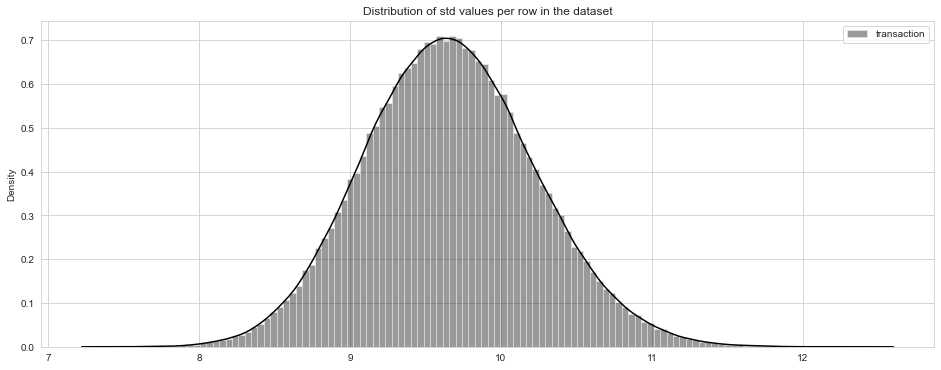

In [21]:
#Let's show the distribution of standard deviation of values per row for datasets.
plt.figure(figsize=(16,6))
plt.title("Distribution of std values per row in the dataset")
sns.distplot(data[features].std(axis=1),color="black", kde=True,bins=120, label='transaction')
plt.legend();plt.show()


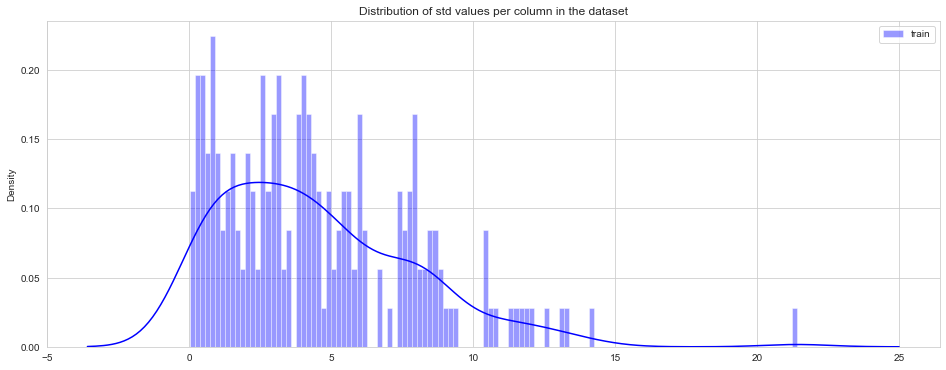

In [22]:
plt.figure(figsize=(16,6))
plt.title("Distribution of std values per column in the dataset")
sns.distplot(data[features].std(axis=0),color="blue",kde=True,bins=120, label='train')
plt.legend(); plt.show()


In [29]:
#Checking for missing values
obs = data.isnull().sum().sort_values(ascending = False)
percent = round(data.isnull().sum().sort_values(ascending = False)/len(data)*100, 2)
pd.concat([obs, percent], axis = 1,keys= ['Number of Observations', 'Percent'])

,Number of Observations,Percent
ID_code,0,0.0
var_136,0,0.0
var_126,0,0.0
var_127,0,0.0
var_128,0,0.0
var_129,0,0.0
var_130,0,0.0
var_131,0,0.0
var_132,0,0.0
var_133,0,0.0


In [30]:
#There are no missing values in this dataset. 

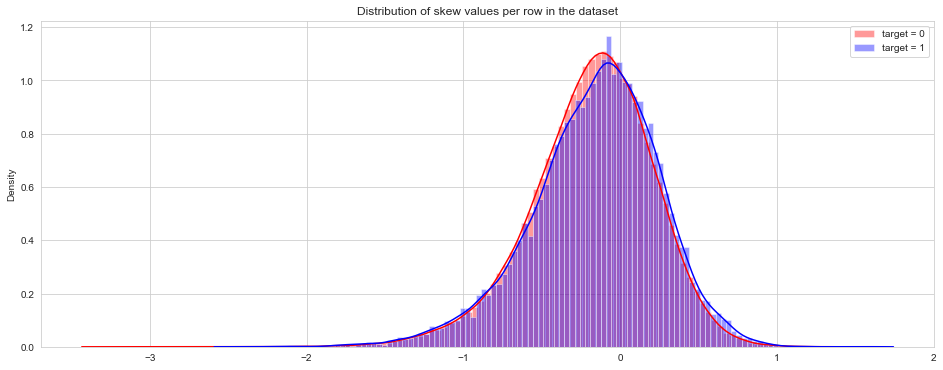

In [32]:
#Distribution of Skewness
t0 = data[data['target'] == 0]

t1 = data[data['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of skew values per row in the dataset")
sns.distplot(t0[features].skew(axis=1),color="red", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].skew(axis=1),color="blue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()

Let's see now the distribution of skewness on columns in data separated for values of target 0 and 1.

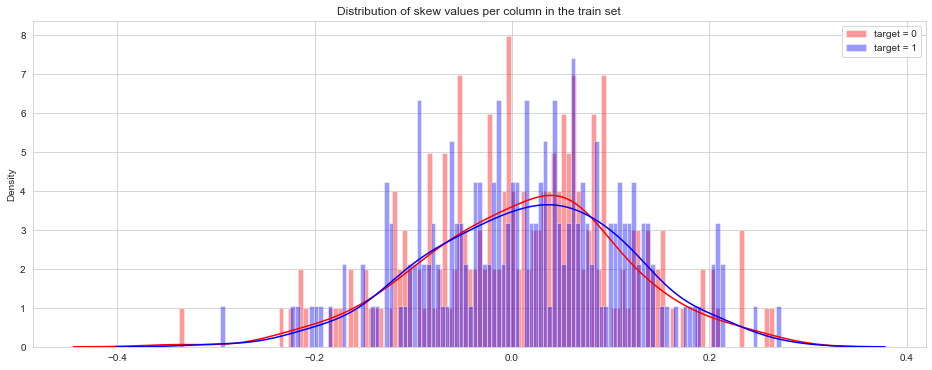

In [33]:
t0 = data[data['target'] == 0]

t1 = data[data['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of skew values per column in the train set")
sns.distplot(t0[features].skew(axis=0),color="red", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].skew(axis=0),color="blue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


#### Distribution of Kurtosis
Let's see now the distribution of kurtosis on rows in train separated for values of target 0 and 1.

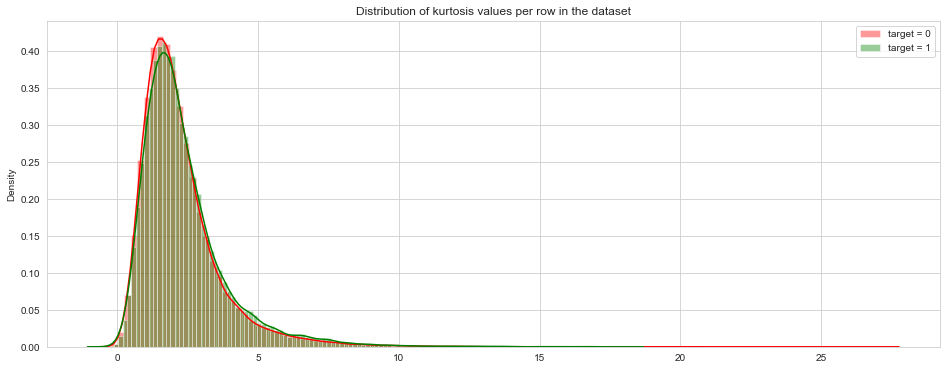

In [34]:
t0 = data[data['target'] == 0]

t1 = data[data['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of kurtosis values per row in the dataset")
sns.distplot(t0[features].kurtosis(axis=1),color="red", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].kurtosis(axis=1),color="green", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()

Let's see now the distribution of kurtosis on columns in dataset separated for values of target 0 and 1.

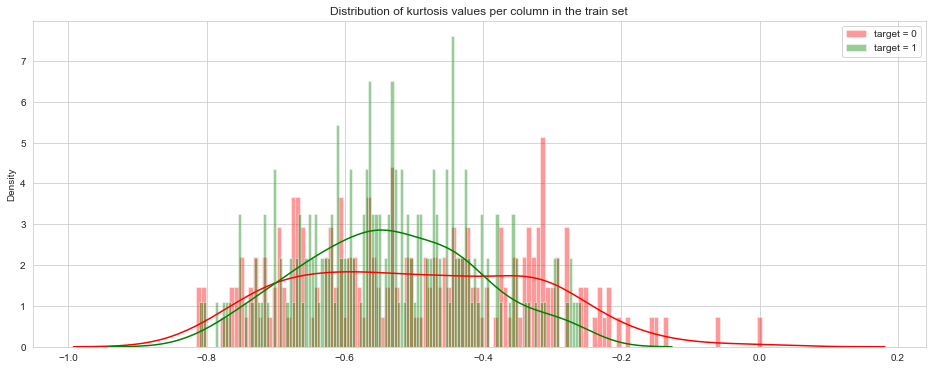

In [35]:
t0 = data[data['target'] == 0]

t1 = data[data['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of kurtosis values per column in the train set")
sns.distplot(t0[features].kurtosis(axis=0),color="red", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].kurtosis(axis=0),color="green", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()

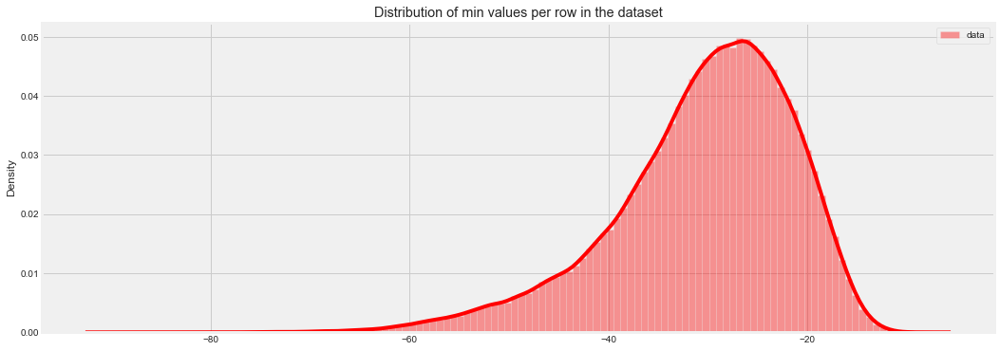

In [66]:
#Distribution of min and max
#Let's check the distribution of min per row in the dataset.
plt.figure(figsize=(16,6))
features = data.columns.values[2:202]
plt.title("Distribution of min values per row in the dataset")
sns.distplot(data[features].min(axis=1),color="red", kde=True,bins=120, label='data')
plt.legend()
plt.show()


In [ ]:
#A long queue to the lower values for both, extended as long as to -80 for test set, is observed.

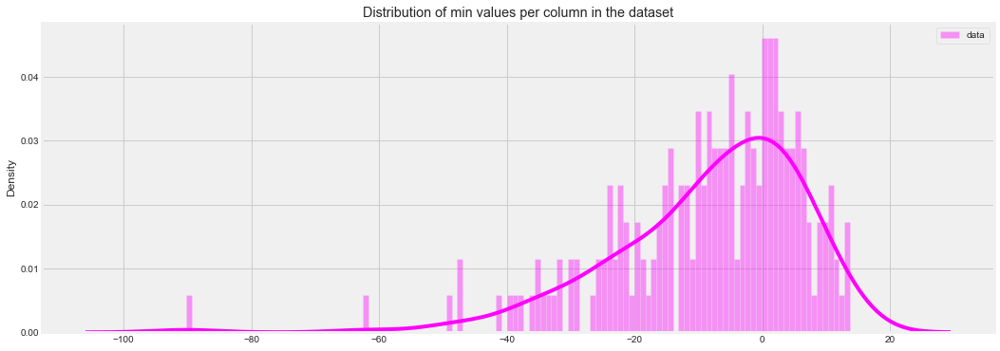

In [67]:
#Let's now show the distribution of min per column in the dataset.
plt.figure(figsize=(16,6))
features = data.columns.values[2:202]
plt.title("Distribution of min values per column in the dataset")
sns.distplot(data[features].min(axis=0),color="magenta", kde=True,bins=120, label='data')
plt.legend()
plt.show()

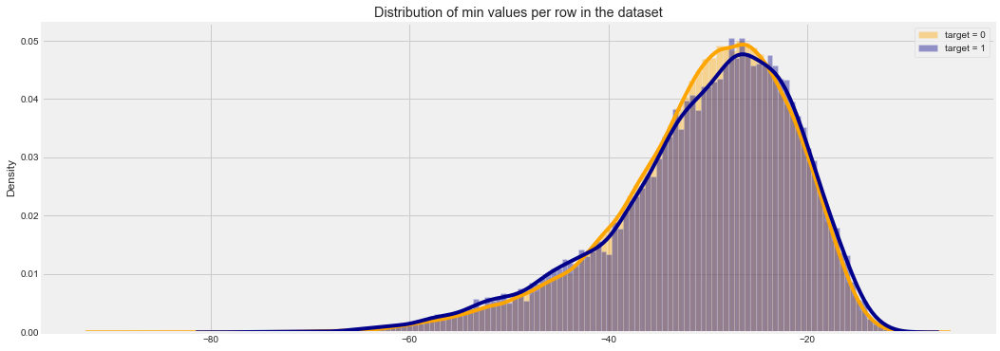

In [69]:
#Let's show now the distributions of min values per row in dataset, separated on the values of target (0 and 1).

t0 = data.loc[data['target'] == 0]
t1 = data.loc[data['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of min values per row in the dataset")
sns.distplot(t0[features].min(axis=1),color="orange", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].min(axis=1),color="darkblue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()

NameError: name 't0' is not defined

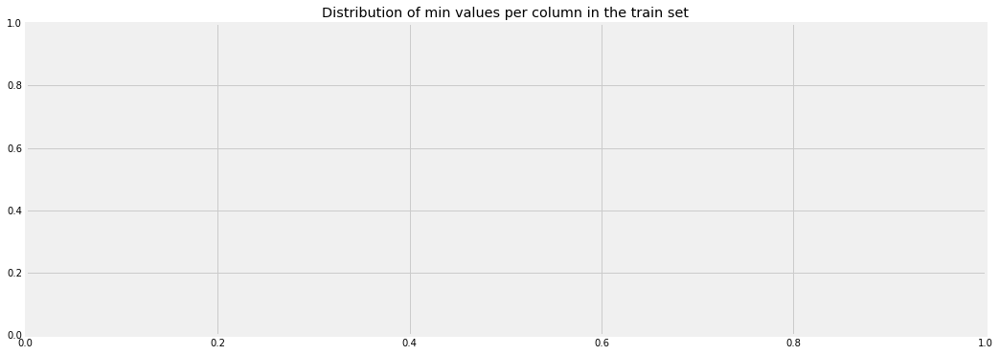

In [4]:
#We show here the distribution of min values per columns in data set.

plt.figure(figsize=(16,6))
plt.title("Distribution of min values per column in the train set")
sns.distplot(t0[features].min(axis=0),color="red", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].min(axis=0),color="blue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


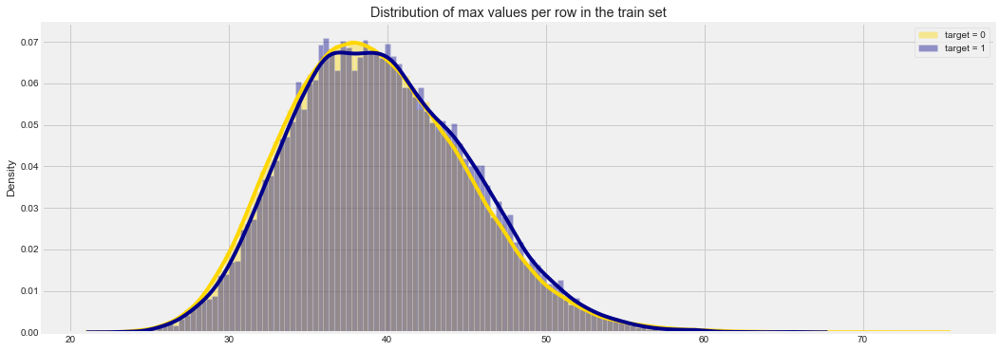

In [71]:
#Let's show now the distribution of max values per rown in the dataset
plt.figure(figsize=(16,6))
plt.title("Distribution of max values per row in the train set")
sns.distplot(t0[features].max(axis=1),color="gold", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].max(axis=1),color="darkblue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()

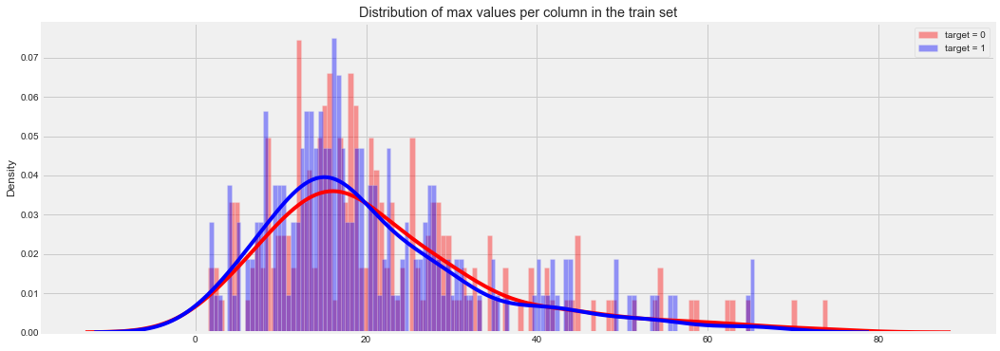

In [74]:
#Let's show also the distribution of max values per columns in the dataset.

plt.figure(figsize=(16,6))
plt.title("Distribution of max values per column in the train set")
sns.distplot(t0[features].max(axis=0),color="red", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].max(axis=0),color="blue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()


In [24]:
#Checking the correlation
corrs =data.corr().abs().unstack().sort_values(kind="quicksort").reset_index()
corrs = corrs[corrs['level_0'] != corrs['level_1']]
corrs.tail(30)

,level_0,level_1,0
40170,target,var_80,0.057609
40171,var_80,target,0.057609
40172,var_166,target,0.057773
40173,target,var_166,0.057773
40174,var_99,target,0.058367
40175,target,var_99,0.058367
40176,target,var_21,0.058483
40177,var_21,target,0.058483
40178,target,var_22,0.060558
40179,var_22,target,0.060558


In [25]:
corrs.head()

,level_0,level_1,0
0,var_191,var_75,2.703975e-08
1,var_75,var_191,2.703975e-08
2,var_173,var_6,5.942735e-08
3,var_6,var_173,5.942735e-08
4,var_126,var_109,1.313947e-07


<AxesSubplot:>

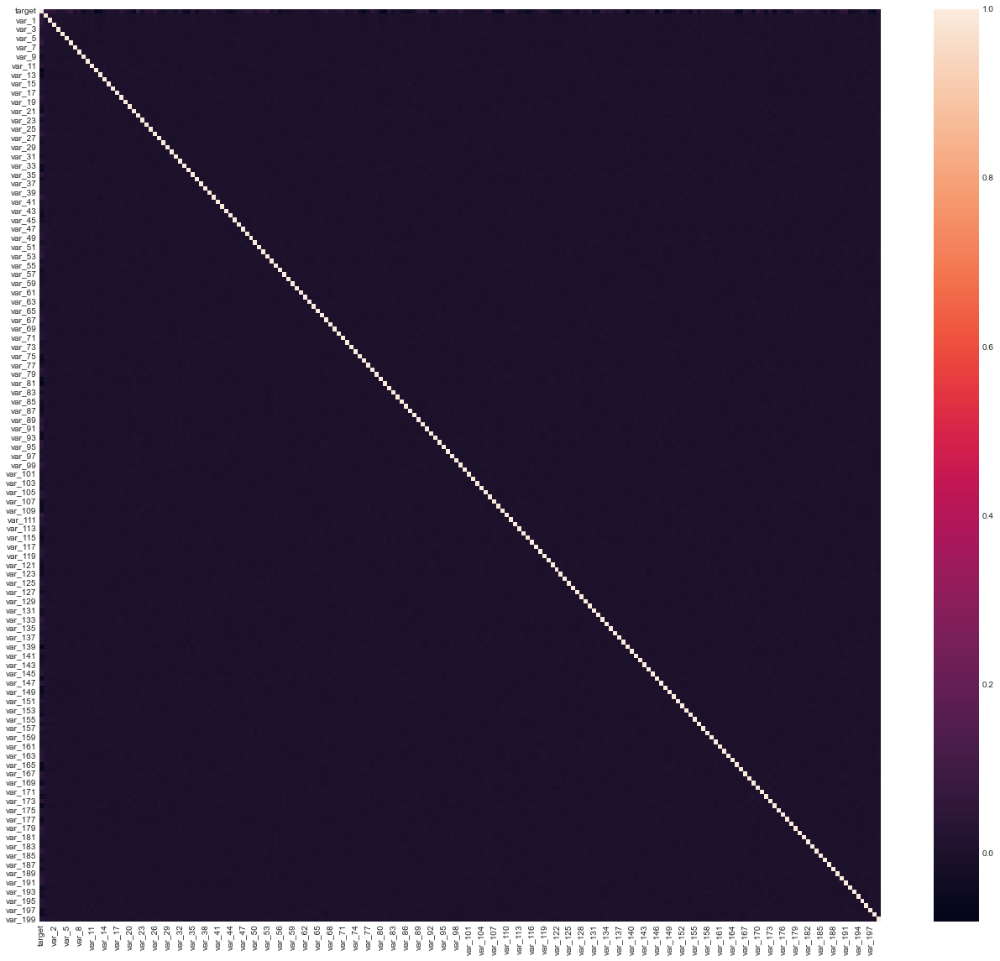

In [63]:
#Heatmap
plt.figure(figsize=(20,20))
sns.heatmap(data.corr())

In [26]:
#We can see that all features have a low correlation with target. So we have no highly correlated features which we could drop, 
#on the other hand we could drop some columns with have little correlation with the target.

Important thing to note is that these correlations are all very small and the corerelations also follow normal distribution. This is for the correlations between the 200 features and the target which is mostly between +0.05 and -0.05. For the correlations between the features themselves they are also weak being mostly between +0.005 and -0.005. There are NO strong correlation hence, feature reduction either by combining features or dropping features will be difficult.

# Feature Engineering and Data Preprocessing

In [4]:
#Dropping unique features.
data.drop(['ID_code'],axis=1,inplace = True)

In [ ]:
#There is no highly correlated and duplicate columns

In [5]:
#Creating X
X = data.drop(labels= ['target'],axis=1)

### Dimensionality reduction using PCA
1.Using standard scaling

In [6]:
#Let's scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)

In [7]:
scaled_data

array([[-0.57710174, -1.27373702,  0.45170728, ..., -0.37396811,
        -1.02639785,  0.21413482],
       [ 0.26995857, -0.62213756,  1.19036045, ..., -0.12939961,
         0.82541712,  0.50568523],
       [-0.68111341, -0.2760664 ,  0.51698836, ..., -0.69514059,
        -0.38144932,  0.35668144],
       ...,
       [ 0.17870987, -0.84546901, -0.07667568, ..., -0.20904171,
        -0.67680579,  0.72102365],
       [-0.31746727, -1.72398014,  1.09630117, ...,  1.22180338,
        -0.11352617, -1.01298853],
       [ 0.06456676, -1.00810962,  0.53130173, ..., -0.78389704,
        -1.24290845,  0.33196403]])

In [8]:
## creating new dataframe
df=pd.DataFrame(data=scaled_data, columns= X.columns)

In [9]:
df.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,-0.577102,-1.273737,0.451707,-0.833709,0.235571,-0.536430,-0.334926,0.608751,-1.561580,-1.473796,0.460091,1.076623,-0.054077,-1.714773,0.561098,-0.009778,-1.401636,-0.229802,-1.395940,2.285292,-0.468989,-0.126734,-0.606166,-1.039947,1.005683,-0.823003,-0.184673,0.479492,-0.768964,0.360340,0.926437,1.162587,-1.299824,0.489773,-0.447275,1.300500,-0.484245,0.897088,-1.396490,0.789254,0.179582,-0.324223,0.509123,1.533101,0.456291,0.265485,-1.889139,-0.164640,0.116264,-1.445719,0.257933,1.907481,0.368029,-1.091818,-0.223968,0.366666,-1.514722,-1.119228,-0.269821,1.386852,0.953771,1.454518,0.593678,-0.281577,1.551733,2.257770,0.010310,1.424133,-1.112326,-0.346204,-0.235063,-0.387918,1.155818,-1.439925,1.671834,0.252319,-1.057511,1.137827,0.587034,-1.683537,1.055809,-0.383475,0.570662,0.230979,-0.310201,0.794207,0.477536,0.902216,-0.282776,-1.525640,-0.372640,-1.355746,-0.393474,-1.040675,1.388299,0.427522,-0.637653,-0.180540,0.589925,-1.431860,1.750971,-0.020872,0.491726,-0.692321,1.624026,2.104318,0.488124,-0.084272,-0.666520,1.355837,-0.910467,0.413522,0.374729,-1.933508,-0.565450,-0.268672,0.090272,-0.039634,-0.922462,1.013930,-0.702227,-0.923810,-0.058680,-1.024974,-0.018613,-1.525514,0.843723,-0.505249,-0.245997,-0.003412,0.686795,-0.407587,1.270955,-0.654603,1.621549,0.970629,0.624732,1.551190,0.355273,1.027749,1.002196,-1.265512,1.243501,-0.363716,0.055578,0.904803,0.486218,-1.776800,0.191144,1.215988,0.689904,0.161129,0.456650,-0.015640,0.707191,0.646555,-1.082956,-1.493440,-0.039210,0.319925,-0.808962,-1.468275,-1.230618,-1.133356,1.749415,-1.323871,-0.711244,0.442890,1.500647,-0.400904,-1.075697,-1.411980,0.122226,0.642079,-0.231051,-1.347890,-0.974846,0.700359,-0.291946,-0.311275,-1.076447,-0.779321,0.261797,1.251424,1.404031,2.086632,0.900016,-0.810464,0.556997,-0.164257,0.263374,-1.149158,0.817469,-0.411013,0.168705,-1.578117,1.022131,-0.373968,-1.026398,0.214135
1,0.269959,-0.622138,1.190360,-0.688846,0.790975,1.539900,0.244461,-0.003525,0.858974,0.419300,-0.144987,1.893408,-0.000409,-0.025160,-0.935586,-2.120000,1.757336,-1.473077,-0.948119,2.017368,-1.678317,-1.771135,1.491237,0.668183,-0.954799,0.782756,-1.302434,-0.932390,-0.621140,-1.722433,-0.202250,-1.165592,0.695096,1.063517,-0.118257,-0.599010,0.196242,-0.011334,0.040634,0.741083,-0.530145,-1.250719,-1.932294,0.692012,-1.305067,-1.620194,-1.382515,1.197234,1.730162,1.148358,-1.310794,-0.024833,-0.316814,0.889088,-1.097157,1.028750,0.760624,0.930521,-0.292466,-0.073613,-0.981607,0.404807,0.454158,

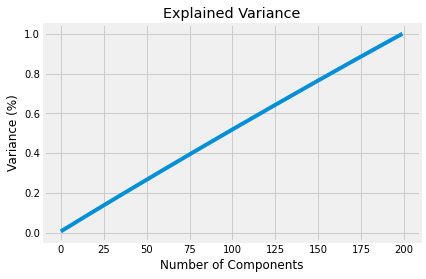

In [10]:
## getting the optimal number of pca
pca = PCA()
principalComponents = pca.fit_transform(df)#shifting of axes will takes place 
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Explained Variance')
plt.show()

From the diagram above, it can be seen that 175 principal components explain almost 90% of the variance in data and 185 principal components explain around 95% of the variance in data.

So, instead of giving all the columns as input, we’d only feed these 175 principal components of the data to the machine learning algorithm and we’d obtain a similar result.

All 200 variables needed to explain 100% of variance, hence the data must be PCA of some other larger dataset and we are more sure that feature reduction would not be a good approach

In [12]:
pca = PCA(n_components= 175)
new_data = pca.fit_transform(df)
principal_Df = pd.DataFrame(data = new_data)

In [13]:
principal_Df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174
0,-0.444408,0.132164,-0.375635,-1.129709,-0.599821,-0.634828,0.565213,-1.155620,-0.990219,-0.175564,0.877534,-0.105117,-0.290087,0.132149,0.863062,-0.695420,-0.577984,0.033245,-1.220314,0.199789,-0.413333,-0.559888,-0.386674,-0.648271,-1.579006,1.216194,0.632520,0.588495,-1.206084,0.127907,2.258430,1.407478,-0.082702,0.526773,-2.222179,0.998959,-1.273212,-0.384862,0.072983,0.427687,1.624805,1.357372,1.740163,-1.409288,-1.179852,1.534204,0.289771,0.980167,-0.196802,-0.010362,-1.297070,0.506915,-0.745655,1.369527,0.897197,-0.273304,0.717484,-1.404048,0.268633,1.041616,0.578794,1.714620,-0.832076,-1.090453,-0.088821,-0.294053,-1.163149,0.311871,-0.471632,-0.218865,1.766599,1.019873,-0.093318,0.254335,0.324797,0.995492,-0.952302,0.124582,-0.933085,1.227081,-0.411886,-0.977603,-0.318557,0.262263,-1.085259,1.268367,-0.447646,-0.068859,0.397255,0.600330,-0.350573,-0.673804,-0.786289,0.533064,0.868322,-1.059316,0.779322,-0.984354,-0.220844,0.722740,0.642729,1.296320,1.620250,0.517913,1.481325,0.286906,-0.188894,-0.478597,2.513974,1.953658,2.219305,0.703465,0.520644,-0.121281,-1.543368,0.210095,1.618143,-0.671224,0.448709,-0.369054,-0.162069,0.949885,0.085158,0.963577,-0.333396,-1.779057,-1.088176,0.458052,1.287576,1.868595,-0.586071,1.322374,-0.139598,0.753432,1.318512,0.020056,1.220081,0.939196,-0.461676,2.050255,0.172656,1.180888,-0.165399,0.426804,0.300948,-0.010475,-0.575781,0.016969,-1.223555,-0.830450,-0.797952,-1.968942,1.405683,0.311526,-0.027656,-0.829486,2.317326,0.170110,-1.619430,-0.255700,0.249333,-1.167947,-1.575956,-0.503275,1.520531,-0.067414,-0.219139,-0.631741,-0.630293,-0.451718,0.015398,-0.215300,-0.064783,0.503858,0.768595
1,2.210684,-0.296311,0.237342,0.714799,-0.036654,-1.080302,-0.594223,0.498450,1.546303,0.000320,-0.515516,1.274996,2.257847,0.009535,-1.968097,-0.375716,-1.398570,-1.242635,0.431091,-0.500061,-0.955673,0.841366,-0.657779,0.298841,0.077076,0.568925,-0.157489,1.446871,1.047159,0.216693,-1.841626,1.109316,0.694886,-0.176263,-0.632732,0.561147,-0.074645,1.052440,0.521973,0.414855,-0.413362,-0.086018,0.522049,0.135299,0.880081,-1.808843,-2.081387,-0.368467,-1.466709,1.393984,2.051650,0.856150,-0.727607,0.651359,-0.089288,1.027394,0.353150,-0.499604,1.438386,1.099968,-0.070660,-0.625843,-0.123629,-0.645999,-0.043746,0.196737,2.369792,0.680196,1.609249,0.024595,0.742010,1.031939,-1.016738,-0.057063,0.365924,-0.372676,-0.613715,0.236335,0.837190,0.090179,0.097014,-1.038252,1.655155,-2.199714,-0.124382,-0.372353,1.685599,-1.362893,0.425000,0.363297,-1.834425,0.423906,1.635487,-0.584523,0.171654,1.757531,-1.493104,-1.872468,0.329736,2.003103,-0.135121,-1.665796,0.905166,0.306822,-0.631047,-0.838981,-0.377204,-0.073978,-0.372209,-0.643321,0.925035,-1.181274,0.246270,-1.413935,0.074031,-0.800930,-0.804129,1.008649,0.160566,0.431178,-2.422069,0.395962,1.987067,-0.474402,-0.162949,-0.723718,0.852729,0.788060,-0.142667,-0.471473,1.286039,-0.901351,0.225796,0.405722,0.055941,-1.108037,-0.536071,-2.226731,0.439779,-0.529180,-1.218849,0.702354,-1.436849,-0.569663,-0.776326,1.737688,-0.137671,1.714098,-0.175939,0.208212,0.074936,1.276419,0.716850,-2.054721,-0.434305,-1.038048,-0.041324,-0.924314,-0.045893,-1.294473,3.246773,1.061324,-0.322655,0.155892,3.389518,1.563515,-0.389126,0.270126,-0.359084,1.885952,0.410466,0.569896,0.643721,1.300088,0.621336
2,-0.065663,-0.114418,-2.040499,-0.079453,-0.539141,-0.255349,-0.766792,0.039588,-1.2

### Model creation with PCA

In [40]:
X = principal_Df ## independent variable
y = data['target'] ## Dependent or target variable or the variable which we have to predict

In [41]:
X.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174
0,-0.444408,0.132164,-0.375635,-1.129709,-0.599821,-0.634828,0.565213,-1.155620,-0.990219,-0.175564,0.877534,-0.105117,-0.290087,0.132149,0.863062,-0.695420,-0.577984,0.033245,-1.220314,0.199789,-0.413333,-0.559888,-0.386674,-0.648271,-1.579006,1.216194,0.632520,0.588495,-1.206084,0.127907,2.258430,1.407478,-0.082702,0.526773,-2.222179,0.998959,-1.273212,-0.384862,0.072983,0.427687,1.624805,1.357372,1.740163,-1.409288,-1.179852,1.534204,0.289771,0.980167,-0.196802,-0.010362,-1.297070,0.506915,-0.745655,1.369527,0.897197,-0.273304,0.717484,-1.404048,0.268633,1.041616,0.578794,1.714620,-0.832076,-1.090453,-0.088821,-0.294053,-1.163149,0.311871,-0.471632,-0.218865,1.766599,1.019873,-0.093318,0.254335,0.324797,0.995492,-0.952302,0.124582,-0.933085,1.227081,-0.411886,-0.977603,-0.318557,0.262263,-1.085259,1.268367,-0.447646,-0.068859,0.397255,0.600330,-0.350573,-0.673804,-0.786289,0.533064,0.868322,-1.059316,0.779322,-0.984354,-0.220844,0.722740,0.642729,1.296320,1.620250,0.517913,1.481325,0.286906,-0.188894,-0.478597,2.513974,1.953658,2.219305,0.703465,0.520644,-0.121281,-1.543368,0.210095,1.618143,-0.671224,0.448709,-0.369054,-0.162069,0.949885,0.085158,0.963577,-0.333396,-1.779057,-1.088176,0.458052,1.287576,1.868595,-0.586071,1.322374,-0.139598,0.753432,1.318512,0.020056,1.220081,0.939196,-0.461676,2.050255,0.172656,1.180888,-0.165399,0.426804,0.300948,-0.010475,-0.575781,0.016969,-1.223555,-0.830450,-0.797952,-1.968942,1.405683,0.311526,-0.027656,-0.829486,2.317326,0.170110,-1.619430,-0.255700,0.249333,-1.167947,-1.575956,-0.503275,1.520531,-0.067414,-0.219139,-0.631741,-0.630293,-0.451718,0.015398,-0.215300,-0.064783,0.503858,0.768595
1,2.210684,-0.296311,0.237342,0.714799,-0.036654,-1.080302,-0.594223,0.498450,1.546303,0.000320,-0.515516,1.274996,2.257847,0.009535,-1.968097,-0.375716,-1.398570,-1.242635,0.431091,-0.500061,-0.955673,0.841366,-0.657779,0.298841,0.077076,0.568925,-0.157489,1.446871,1.047159,0.216693,-1.841626,1.109316,0.694886,-0.176263,-0.632732,0.561147,-0.074645,1.052440,0.521973,0.414855,-0.413362,-0.086018,0.522049,0.135299,0.880081,-1.808843,-2.081387,-0.368467,-1.466709,1.393984,2.051650,0.856150,-0.727607,0.651359,-0.089288,1.027394,0.353150,-0.499604,1.438386,1.099968,-0.070660,-0.625843,-0.123629,-0.645999,-0.043746,0.196737,2.369792,0.680196,1.609249,0.024595,0.742010,1.031939,-1.016738,-0.057063,0.365924,-0.372676,-0.613715,0.236335,0.837190,0.090179,0.097014,-1.038252,1.655155,-2.199714,-0.124382,-0.372353,1.685599,-1.362893,0.425000,0.363297,-1.834425,0.423906,1.635487,-0.584523,0.171654,1.757531,-1.493104,-1.872468,0.329736,2.003103,-0.135121,-1.665796,0.905166,0.306822,-0.631047,-0.838981,-0.377204,-0.073978,-0.372209,-0.643321,0.925035,-1.181274,0.246270,-1.413935,0.074031,-0.800930,-0.804129,1.008649,0.160566,0.431178,-2.422069,0.395962,1.987067,-0.474402,-0.162949,-0.723718,0.852729,0.788060,-0.142667,-0.471473,1.286039,-0.901351,0.225796,0.405722,0.055941,-1.108037,-0.536071,-2.226731,0.439779,-0.529180,-1.218849,0.702354,-1.436849,-0.569663,-0.776326,1.737688,-0.137671,1.714098,-0.175939,0.208212,0.074936,1.276419,0.716850,-2.054721,-0.434305,-1.038048,-0.041324,-0.924314,-0.045893,-1.294473,3.246773,1.061324,-0.322655,0.155892,3.389518,1.563515,-0.389126,0.270126,-0.359084,1.885952,0.410466,0.569896,0.643721,1.300088,0.621336
2,-0.065663,-0.114418,-2.040499,-0.079453,-0.539141,-0.255349,-0.766792,0.039588,-1.2

In [42]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

In [6]:
## creating training and testing data
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size= 0.25,random_state = 42)#splitting data into train and test

In [20]:
X.shape

(200000, 175)

In [21]:
data.target.value_counts()

0    179902
1     20098
Name: target, dtype: int64

In [15]:
# Install imblearn package - pip install imblearn
smote = SMOTE()

In [16]:
X_smote, y_smote = smote.fit_resample(X_train,y_train)

In [17]:
print("Actual Classes",Counter(y_train))
print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({0: 143922, 1: 16078})
SMOTE Classes Counter({0: 143922, 1: 143922})


In [25]:
##Model creation
log_reg = LogisticRegression()#object creation of logistic regression
    
log_reg.fit(X_train,y_train)#training model with training

LogisticRegression()

In [26]:
y_pred = log_reg.predict(X_test) # testing model 

In [27]:
y_train_pre=log_reg.predict(X_train)# predicting y_train 

In [29]:
test_accuracy=accuracy_score(y_test,y_pred)
test_accuracy

0.910425

In [30]:
Precision = precision_score(y_test,y_pred)# the number of true positive divided by the total number of positive prediction
Precision

0.6674329501915709

In [31]:
# Recall on testing
Recall = recall_score(y_test,y_pred)# the total number of positive results how many positives were correctly predicted by the model.
Recall

0.21666666666666667

In [32]:
# F1 Score
F1_Score = f1_score(y_test,y_pred)# when precision and recall both are important
F1_Score

0.3271361502347418

In [33]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[35546,   434],
       [ 3149,   871]], dtype=int64)

In [34]:
report=classification_report(y_test, y_pred)# it will give precision,recall,f1 scores and accuracy  
print(report)

              precision    recall  f1-score   support

           0       0.92      0.99      0.95     35980
           1       0.67      0.22      0.33      4020

    accuracy                           0.91     40000
   macro avg       0.79      0.60      0.64     40000
weighted avg       0.89      0.91      0.89     40000



#### Calculating ROC and AUC

In [35]:
probs=log_reg.predict_proba(X_test)[:,1]

In [36]:
## Defining the threshold limit
def predict_threshold (LR1,X_test,thresholds):
    return np.where(LR1.predict_proba(X_test)[:,1]>thresholds,1,0)
#checking where probability of class 1 is  greater than threshold

In [38]:
for thr in np.arange(0,1.0,0.1):# it will create matrix /array from range 0 to 1 with step 0.1
    y_predict = predict_threshold(log_reg,X_test,thr)# it will check result  for  each threshold from 0 to 0.1
    print("Threshold :",thr)#printing threshold
    print(confusion_matrix(y_test,y_predict))# confusion matrix for each prediction

Threshold : 0.0
[[    0 35980]
 [    0  4020]]
Threshold : 0.1
[[27770  8210]
 [  981  3039]]
Threshold : 0.2
[[32579  3401]
 [ 1757  2263]]
Threshold : 0.30000000000000004
[[34305  1675]
 [ 2323  1697]]
Threshold : 0.4
[[35132   848]
 [ 2773  1247]]
Threshold : 0.5
[[35546   434]
 [ 3149   871]]
Threshold : 0.6000000000000001
[[35775   205]
 [ 3432   588]]
Threshold : 0.7000000000000001
[[35889    91]
 [ 3639   381]]
Threshold : 0.8
[[35955    25]
 [ 3833   187]]
Threshold : 0.9
[[35973     7]
 [ 3956    64]]


In [39]:
## visualizing the roc plot
def plot_roc_curve(fpr, tpr):# function to plot roc curve
    plt.plot(fpr, tpr, color='orange', label='ROC')#line plot between fpr and tpr
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')# assigning name to  x axis
    plt.ylabel('True Positive Rate')# assigning name to y axis
    plt.title('Receiver Operating Characteristic (ROC) Curve')#assigning name to curve  
    plt.legend()#area describing the elements of the graph
    plt.show()#to show graph without location

In [40]:
## used to compare multiple models
auc = roc_auc_score(y_test, probs) #roc curve 
print('AUC: %.2f' % auc)

AUC: 0.85


In [41]:
fpr, tpr, thresholds = roc_curve(y_test, probs)
# it will return 
#Increasing false positive rates such that element i is the false positive rate of predictions with score >= thresholds[i].
#Increasing true positive rates such that element i is the true positive rate of predictions with score >= thresholds[i].
#Decreasing thresholds on the decision function used to compute fpr and tpr

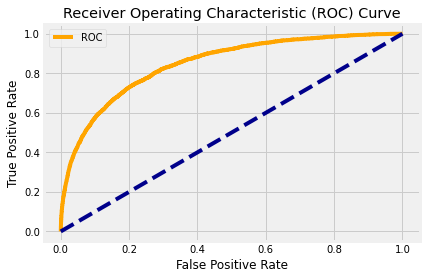

In [42]:
plot_roc_curve(fpr,tpr)

In [ ]:
#Actually PCA doesnt work for this data .As we can see 1 class fpr linear regresssion is performing bad.
#Lets do feature selection by other methods.

# Outlier detection

In [ ]:
# find outliers and replace them with maximum and minimum and after the changes on the columns add them as new columns

In [4]:
y=data['target'].values
x=data.drop(['target','ID_code'],axis=1)
print('x.shape before IQR:',x.shape)
def IQR(df):    
    for col in df.columns:
        if col not in ('ID_code', 'target') :            
            col_new = col + '_IQR'
            df[col_new] = df[col]
            q1, q3= np.percentile(df[col_new],[25,75])
            IQR=q3-q1
            max_IQR=q3+1.5*IQR
            min_IQR=q1-1.5*IQR
            df[col_new][df[col_new]>=max_IQR] = max_IQR
            df[col_new][df[col_new]<=min_IQR] = min_IQR
    return df
X_df=IQR(x)
print('X_df.shape:',X_df.shape)

x.shape before IQR: (200000, 200)
X_df.shape: (200000, 400)


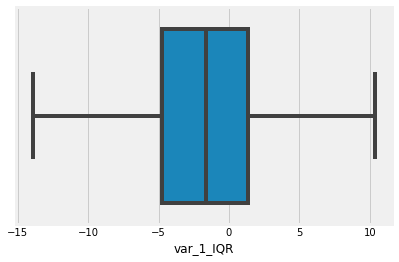

In [5]:
sns.boxplot(X_df['var_1_IQR'])
plt.show()

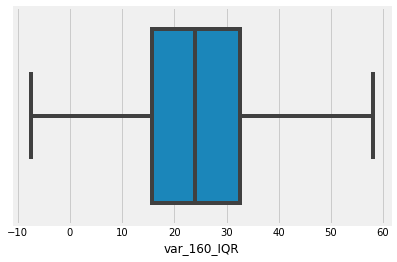

In [6]:
sns.boxplot(X_df['var_160_IQR'])
plt.show()

In [7]:
#Now we can save our data frame to a csv file file1 for use in algorithms that uses handled outliers.
X_df.to_csv('fileout.csv')

In [8]:
#split columns without outliers for PCA because PCA is sensetive on outliers and its better do it on these columns

In [6]:
data_out = pd.read_csv('fileout.csv')

In [11]:
data_out.shape

(200000, 401)

In [7]:

df_without_outlier=data_out.iloc[:,201:]
df_without_outlier.shape

(200000, 200)

In [22]:
df_without_outlier.head()

,var_0_IQR,var_1_IQR,var_2_IQR,var_3_IQR,var_4_IQR,var_5_IQR,var_6_IQR,var_7_IQR,var_8_IQR,var_9_IQR,var_10_IQR,var_11_IQR,var_12_IQR,var_13_IQR,var_14_IQR,var_15_IQR,var_16_IQR,var_17_IQR,var_18_IQR,var_19_IQR,var_20_IQR,var_21_IQR,var_22_IQR,var_23_IQR,var_24_IQR,var_25_IQR,var_26_IQR,var_27_IQR,var_28_IQR,var_29_IQR,var_30_IQR,var_31_IQR,var_32_IQR,var_33_IQR,var_34_IQR,var_35_IQR,var_36_IQR,var_37_IQR,var_38_IQR,var_39_IQR,var_40_IQR,var_41_IQR,var_42_IQR,var_43_IQR,var_44_IQR,var_45_IQR,var_46_IQR,var_47_IQR,var_48_IQR,var_49_IQR,var_50_IQR,var_51_IQR,var_52_IQR,var_53_IQR,var_54_IQR,var_55_IQR,var_56_IQR,var_57_IQR,var_58_IQR,var_59_IQR,var_60_IQR,var_61_IQR,var_62_IQR,var_63_IQR,var_64_IQR,var_65_IQR,var_66_IQR,var_67_IQR,var_68_IQR,var_69_IQR,var_70_IQR,var_71_IQR,var_72_IQR,var_73_IQR,var_74_IQR,var_75_IQR,var_76_IQR,var_77_IQR,var_78_IQR,var_79_IQR,var_80_IQR,var_81_IQR,var_82_IQR,var_83_IQR,var_84_IQR,var_85_IQR,var_86_IQR,var_87_IQR,var_88_IQR,var_89_IQR,var_90_IQR,var_91_IQR,var_92_IQR,var_93_IQR,var_94_IQR,var_95_IQR,var_96_IQR,var_97_IQR,var_98_IQR,var_99_IQR,var_100_IQR,var_101_IQR,var_102_IQR,var_103_IQR,var_104_IQR,var_105_IQR,var_106_IQR,var_107_IQR,var_108_IQR,var_109_IQR,var_110_IQR,var_111_IQR,var_112_IQR,var_113_IQR,var_114_IQR,var_115_IQR,var_116_IQR,var_117_IQR,var_118_IQR,var_119_IQR,var_120_IQR,var_121_IQR,var_122_IQR,var_123_IQR,var_124_IQR,var_125_IQR,var_126_IQR,var_127_IQR,var_128_IQR,var_129_IQR,var_130_IQR,var_131_IQR,var_132_IQR,var_133_IQR,var_134_IQR,var_135_IQR,var_136_IQR,var_137_IQR,var_138_IQR,var_139_IQR,var_140_IQR,var_141_IQR,var_142_IQR,var_143_IQR,var_144_IQR,var_145_IQR,var_146_IQR,var_147_IQR,var_148_IQR,var_149_IQR,var_150_IQR,var_151_IQR,var_152_IQR,var_153_IQR,var_154_IQR,var_155_IQR,var_156_IQR,var_157_IQR,var_158_IQR,var_159_IQR,var_160_IQR,var_161_IQR,var_162_IQR,var_163_IQR,var_164_IQR,var_165_IQR,var_166_IQR,var_167_IQR,var_168_IQR,var_169_IQR,var_170_IQR,var_171_IQR,var_172_IQR,var_173_IQR,var_174_IQR,var_175_IQR,var_176_IQR,var_177_IQR,var_178_IQR,var_179_IQR,var_180_IQR,var_181_IQR,var_182_IQR,var_183_IQR,var_184_IQR,var_185_IQR,var_186_IQR,var_187_IQR,var_188_IQR,var_189_IQR,var_190_IQR,var_191_IQR,var_192_IQR,var_193_IQR,var_194_IQR,var_195_IQR,var_196_IQR,var_197_IQR,var_198_IQR,var_199_IQR
0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.72020,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,

In [8]:
#Let's scale the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_without_outlier)

In [9]:
scaled_data

array([[-0.57721291, -1.27375261,  0.45173038, ..., -0.37398175,
        -1.02655273,  0.21413069],
       [ 0.26998507, -0.62214677,  1.19041973, ..., -0.12938926,
         0.82559449,  0.50569286],
       [-0.68124149, -0.27607222,  0.51701466, ..., -0.69518574,
        -0.38148849,  0.35668305],
       ...,
       [ 0.17872154, -0.84548041, -0.07667845, ..., -0.20903916,
        -0.67689795,  0.72103995],
       [-0.31753625, -1.72400014,  1.09635584, ...,  1.22194631,
        -0.11351727, -1.01304213],
       [ 0.06455988, -1.00812261,  0.53132873, ..., -0.7839509 ,
        -1.24310218,  0.33196465]])

In [10]:
## creating new dataframe
df=pd.DataFrame(data=scaled_data, columns= df_without_outlier.columns)

In [11]:
df.head()

,var_0_IQR,var_1_IQR,var_2_IQR,var_3_IQR,var_4_IQR,var_5_IQR,var_6_IQR,var_7_IQR,var_8_IQR,var_9_IQR,var_10_IQR,var_11_IQR,var_12_IQR,var_13_IQR,var_14_IQR,var_15_IQR,var_16_IQR,var_17_IQR,var_18_IQR,var_19_IQR,var_20_IQR,var_21_IQR,var_22_IQR,var_23_IQR,var_24_IQR,var_25_IQR,var_26_IQR,var_27_IQR,var_28_IQR,var_29_IQR,var_30_IQR,var_31_IQR,var_32_IQR,var_33_IQR,var_34_IQR,var_35_IQR,var_36_IQR,var_37_IQR,var_38_IQR,var_39_IQR,var_40_IQR,var_41_IQR,var_42_IQR,var_43_IQR,var_44_IQR,var_45_IQR,var_46_IQR,var_47_IQR,var_48_IQR,var_49_IQR,var_50_IQR,var_51_IQR,var_52_IQR,var_53_IQR,var_54_IQR,var_55_IQR,var_56_IQR,var_57_IQR,var_58_IQR,var_59_IQR,var_60_IQR,var_61_IQR,var_62_IQR,var_63_IQR,var_64_IQR,var_65_IQR,var_66_IQR,var_67_IQR,var_68_IQR,var_69_IQR,var_70_IQR,var_71_IQR,var_72_IQR,var_73_IQR,var_74_IQR,var_75_IQR,var_76_IQR,var_77_IQR,var_78_IQR,var_79_IQR,var_80_IQR,var_81_IQR,var_82_IQR,var_83_IQR,var_84_IQR,var_85_IQR,var_86_IQR,var_87_IQR,var_88_IQR,var_89_IQR,var_90_IQR,var_91_IQR,var_92_IQR,var_93_IQR,var_94_IQR,var_95_IQR,var_96_IQR,var_97_IQR,var_98_IQR,var_99_IQR,var_100_IQR,var_101_IQR,var_102_IQR,var_103_IQR,var_104_IQR,var_105_IQR,var_106_IQR,var_107_IQR,var_108_IQR,var_109_IQR,var_110_IQR,var_111_IQR,var_112_IQR,var_113_IQR,var_114_IQR,var_115_IQR,var_116_IQR,var_117_IQR,var_118_IQR,var_119_IQR,var_120_IQR,var_121_IQR,var_122_IQR,var_123_IQR,var_124_IQR,var_125_IQR,var_126_IQR,var_127_IQR,var_128_IQR,var_129_IQR,var_130_IQR,var_131_IQR,var_132_IQR,var_133_IQR,var_134_IQR,var_135_IQR,var_136_IQR,var_137_IQR,var_138_IQR,var_139_IQR,var_140_IQR,var_141_IQR,var_142_IQR,var_143_IQR,var_144_IQR,var_145_IQR,var_146_IQR,var_147_IQR,var_148_IQR,var_149_IQR,var_150_IQR,var_151_IQR,var_152_IQR,var_153_IQR,var_154_IQR,var_155_IQR,var_156_IQR,var_157_IQR,var_158_IQR,var_159_IQR,var_160_IQR,var_161_IQR,var_162_IQR,var_163_IQR,var_164_IQR,var_165_IQR,var_166_IQR,var_167_IQR,var_168_IQR,var_169_IQR,var_170_IQR,var_171_IQR,var_172_IQR,var_173_IQR,var_174_IQR,var_175_IQR,var_176_IQR,var_177_IQR,var_178_IQR,var_179_IQR,var_180_IQR,var_181_IQR,var_182_IQR,var_183_IQR,var_184_IQR,var_185_IQR,var_186_IQR,var_187_IQR,var_188_IQR,var_189_IQR,var_190_IQR,var_191_IQR,var_192_IQR,var_193_IQR,var_194_IQR,var_195_IQR,var_196_IQR,var_197_IQR,var_198_IQR,var_199_IQR
0,-0.577213,-1.273753,0.451730,-0.833752,0.235565,-0.536439,-0.335009,0.608774,-1.561584,-1.473796,0.460155,1.077503,-0.054056,-1.714775,0.561102,-0.009793,-1.401875,-0.230012,-1.395972,2.285293,-0.468990,-0.126662,-0.606399,-1.040123,1.005721,-0.823230,-0.184780,0.479494,-0.769371,0.360373,0.926446,1.165497,-1.299834,0.489781,-0.447278,1.301130,-0.484409,0.897089,-1.398806,0.789671,0.179571,-0.324223,0.509139,1.533170,0.456877,0.265520,-1.890108,-0.164642,0.116284,-1.445728,0.258308,1.907630,0.368220,-1.091915,-0.223977,0.366666,-1.516029,-1.119590,-0.269938,1.387100,0.953781,1.454689,0.594259,-0.281855,1.551789,2.259419,0.010310,1.426268,-1.112576,-0.346220,-0.235071,-0.387952,1.156187,-1.439967,1.673357,0.252329,-1.058067,1.137827,0.587038,-1.683537,1.055863,-0.383519,0.570662,0.230983,-0.310259,0.794226,0.477780,0.902658,-0.282774,-1.526040,-0.372654,-1.355776,-0.393496,-1.044074,1.388299,0.427581,-0.637655,-0.180544,0.590407,-1.432158,1.751792,-0.020872,0.491811,-0.692347,1.625755,2.107779,0.488599,-0.084218,-0.666520,1.355838,-0.911530,0.413579,0.374732,-1.933509,-0.565490,-0.268772,0.090271,-0.039656,-0.923318,1.013932,-0.702659,-0.923828,-0.058673,-1.025020,-0.018958,-1.526074,0.843723,-0.505250,-0.246006,-0.003351,0.686809,-0.407593,1.271016,-0.655370,1.621551,0.970682,0.624732,1.551190,0.355514,1.028448,1.002499,-1.265512,1.244179,-0.363750,0.055566,0.904825,0.487078,-1.777221,0.191493,1.217731,0.689940,0.161128,0.456869,-0.015635,0.707206,0.646900,-1.083007,-1.493558,-0.039200,0.320022,-0.808963,-1.468396,-1.230961,-1.133514,1.749416,-1.324055,-0.711267,0.443054,1.501161,-0.401002,-1.076573,-1.412772,0.122633,0.642232,-0.231074,-1.347895,-0.974955,0.700364,-0.291956,-0.

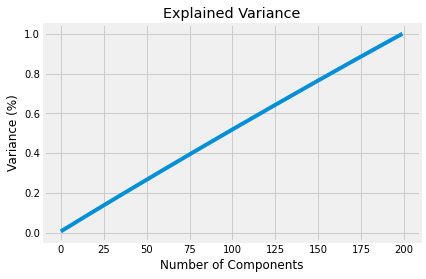

In [12]:
## getting the optimal number of pca
pca = PCA()
principalComponents = pca.fit_transform(df)#shifting of axes will takes place 
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Explained Variance')
plt.show()

In [13]:
pca = PCA(n_components= 175)
new_data = pca.fit_transform(df)
principal_Df = pd.DataFrame(data = new_data)

In [13]:
principal_Df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174
0,-0.444408,0.132164,-0.375635,-1.129709,-0.599821,-0.634828,0.565213,-1.155620,-0.990219,-0.175564,0.877534,-0.105117,-0.290087,0.132149,0.863062,-0.695420,-0.577984,0.033245,-1.220314,0.199789,-0.413333,-0.559888,-0.386674,-0.648271,-1.579006,1.216194,0.632520,0.588495,-1.206084,0.127907,2.258430,1.407478,-0.082702,0.526773,-2.222179,0.998959,-1.273212,-0.384862,0.072983,0.427687,1.624805,1.357372,1.740163,-1.409288,-1.179852,1.534204,0.289771,0.980167,-0.196802,-0.010362,-1.297070,0.506915,-0.745655,1.369527,0.897197,-0.273304,0.717484,-1.404048,0.268633,1.041616,0.578794,1.714620,-0.832076,-1.090453,-0.088821,-0.294053,-1.163149,0.311871,-0.471632,-0.218865,1.766599,1.019873,-0.093318,0.254335,0.324797,0.995492,-0.952302,0.124582,-0.933085,1.227081,-0.411886,-0.977603,-0.318557,0.262263,-1.085259,1.268367,-0.447646,-0.068859,0.397255,0.600330,-0.350573,-0.673804,-0.786289,0.533064,0.868322,-1.059316,0.779322,-0.984354,-0.220844,0.722740,0.642729,1.296320,1.620250,0.517913,1.481325,0.286906,-0.188894,-0.478597,2.513974,1.953658,2.219305,0.703465,0.520644,-0.121281,-1.543368,0.210095,1.618143,-0.671224,0.448709,-0.369054,-0.162069,0.949885,0.085158,0.963577,-0.333396,-1.779057,-1.088176,0.458052,1.287576,1.868595,-0.586071,1.322374,-0.139598,0.753432,1.318512,0.020056,1.220081,0.939196,-0.461676,2.050255,0.172656,1.180888,-0.165399,0.426804,0.300948,-0.010475,-0.575781,0.016969,-1.223555,-0.830450,-0.797952,-1.968942,1.405683,0.311526,-0.027656,-0.829486,2.317326,0.170110,-1.619430,-0.255700,0.249333,-1.167947,-1.575956,-0.503275,1.520531,-0.067414,-0.219139,-0.631741,-0.630293,-0.451718,0.015398,-0.215300,-0.064783,0.503858,0.768595
1,2.210684,-0.296311,0.237342,0.714799,-0.036654,-1.080302,-0.594223,0.498450,1.546303,0.000320,-0.515516,1.274996,2.257847,0.009535,-1.968097,-0.375716,-1.398570,-1.242635,0.431091,-0.500061,-0.955673,0.841366,-0.657779,0.298841,0.077076,0.568925,-0.157489,1.446871,1.047159,0.216693,-1.841626,1.109316,0.694886,-0.176263,-0.632732,0.561147,-0.074645,1.052440,0.521973,0.414855,-0.413362,-0.086018,0.522049,0.135299,0.880081,-1.808843,-2.081387,-0.368467,-1.466709,1.393984,2.051650,0.856150,-0.727607,0.651359,-0.089288,1.027394,0.353150,-0.499604,1.438386,1.099968,-0.070660,-0.625843,-0.123629,-0.645999,-0.043746,0.196737,2.369792,0.680196,1.609249,0.024595,0.742010,1.031939,-1.016738,-0.057063,0.365924,-0.372676,-0.613715,0.236335,0.837190,0.090179,0.097014,-1.038252,1.655155,-2.199714,-0.124382,-0.372353,1.685599,-1.362893,0.425000,0.363297,-1.834425,0.423906,1.635487,-0.584523,0.171654,1.757531,-1.493104,-1.872468,0.329736,2.003103,-0.135121,-1.665796,0.905166,0.306822,-0.631047,-0.838981,-0.377204,-0.073978,-0.372209,-0.643321,0.925035,-1.181274,0.246270,-1.413935,0.074031,-0.800930,-0.804129,1.008649,0.160566,0.431178,-2.422069,0.395962,1.987067,-0.474402,-0.162949,-0.723718,0.852729,0.788060,-0.142667,-0.471473,1.286039,-0.901351,0.225796,0.405722,0.055941,-1.108037,-0.536071,-2.226731,0.439779,-0.529180,-1.218849,0.702354,-1.436849,-0.569663,-0.776326,1.737688,-0.137671,1.714098,-0.175939,0.208212,0.074936,1.276419,0.716850,-2.054721,-0.434305,-1.038048,-0.041324,-0.924314,-0.045893,-1.294473,3.246773,1.061324,-0.322655,0.155892,3.389518,1.563515,-0.389126,0.270126,-0.359084,1.885952,0.410466,0.569896,0.643721,1.300088,0.621336
2,-0.065663,-0.114418,-2.040499,-0.079453,-0.539141,-0.255349,-0.766792,0.039588,-1.2

### Model creation with PCA

In [14]:
X = principal_Df ## independent variable
y = data['target'] ## Dependent or target variable or the variable which we have to predict

In [41]:
X.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174
0,-0.444408,0.132164,-0.375635,-1.129709,-0.599821,-0.634828,0.565213,-1.155620,-0.990219,-0.175564,0.877534,-0.105117,-0.290087,0.132149,0.863062,-0.695420,-0.577984,0.033245,-1.220314,0.199789,-0.413333,-0.559888,-0.386674,-0.648271,-1.579006,1.216194,0.632520,0.588495,-1.206084,0.127907,2.258430,1.407478,-0.082702,0.526773,-2.222179,0.998959,-1.273212,-0.384862,0.072983,0.427687,1.624805,1.357372,1.740163,-1.409288,-1.179852,1.534204,0.289771,0.980167,-0.196802,-0.010362,-1.297070,0.506915,-0.745655,1.369527,0.897197,-0.273304,0.717484,-1.404048,0.268633,1.041616,0.578794,1.714620,-0.832076,-1.090453,-0.088821,-0.294053,-1.163149,0.311871,-0.471632,-0.218865,1.766599,1.019873,-0.093318,0.254335,0.324797,0.995492,-0.952302,0.124582,-0.933085,1.227081,-0.411886,-0.977603,-0.318557,0.262263,-1.085259,1.268367,-0.447646,-0.068859,0.397255,0.600330,-0.350573,-0.673804,-0.786289,0.533064,0.868322,-1.059316,0.779322,-0.984354,-0.220844,0.722740,0.642729,1.296320,1.620250,0.517913,1.481325,0.286906,-0.188894,-0.478597,2.513974,1.953658,2.219305,0.703465,0.520644,-0.121281,-1.543368,0.210095,1.618143,-0.671224,0.448709,-0.369054,-0.162069,0.949885,0.085158,0.963577,-0.333396,-1.779057,-1.088176,0.458052,1.287576,1.868595,-0.586071,1.322374,-0.139598,0.753432,1.318512,0.020056,1.220081,0.939196,-0.461676,2.050255,0.172656,1.180888,-0.165399,0.426804,0.300948,-0.010475,-0.575781,0.016969,-1.223555,-0.830450,-0.797952,-1.968942,1.405683,0.311526,-0.027656,-0.829486,2.317326,0.170110,-1.619430,-0.255700,0.249333,-1.167947,-1.575956,-0.503275,1.520531,-0.067414,-0.219139,-0.631741,-0.630293,-0.451718,0.015398,-0.215300,-0.064783,0.503858,0.768595
1,2.210684,-0.296311,0.237342,0.714799,-0.036654,-1.080302,-0.594223,0.498450,1.546303,0.000320,-0.515516,1.274996,2.257847,0.009535,-1.968097,-0.375716,-1.398570,-1.242635,0.431091,-0.500061,-0.955673,0.841366,-0.657779,0.298841,0.077076,0.568925,-0.157489,1.446871,1.047159,0.216693,-1.841626,1.109316,0.694886,-0.176263,-0.632732,0.561147,-0.074645,1.052440,0.521973,0.414855,-0.413362,-0.086018,0.522049,0.135299,0.880081,-1.808843,-2.081387,-0.368467,-1.466709,1.393984,2.051650,0.856150,-0.727607,0.651359,-0.089288,1.027394,0.353150,-0.499604,1.438386,1.099968,-0.070660,-0.625843,-0.123629,-0.645999,-0.043746,0.196737,2.369792,0.680196,1.609249,0.024595,0.742010,1.031939,-1.016738,-0.057063,0.365924,-0.372676,-0.613715,0.236335,0.837190,0.090179,0.097014,-1.038252,1.655155,-2.199714,-0.124382,-0.372353,1.685599,-1.362893,0.425000,0.363297,-1.834425,0.423906,1.635487,-0.584523,0.171654,1.757531,-1.493104,-1.872468,0.329736,2.003103,-0.135121,-1.665796,0.905166,0.306822,-0.631047,-0.838981,-0.377204,-0.073978,-0.372209,-0.643321,0.925035,-1.181274,0.246270,-1.413935,0.074031,-0.800930,-0.804129,1.008649,0.160566,0.431178,-2.422069,0.395962,1.987067,-0.474402,-0.162949,-0.723718,0.852729,0.788060,-0.142667,-0.471473,1.286039,-0.901351,0.225796,0.405722,0.055941,-1.108037,-0.536071,-2.226731,0.439779,-0.529180,-1.218849,0.702354,-1.436849,-0.569663,-0.776326,1.737688,-0.137671,1.714098,-0.175939,0.208212,0.074936,1.276419,0.716850,-2.054721,-0.434305,-1.038048,-0.041324,-0.924314,-0.045893,-1.294473,3.246773,1.061324,-0.322655,0.155892,3.389518,1.563515,-0.389126,0.270126,-0.359084,1.885952,0.410466,0.569896,0.643721,1.300088,0.621336
2,-0.065663,-0.114418,-2.040499,-0.079453,-0.539141,-0.255349,-0.766792,0.039588,-1.2

In [42]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

In [15]:
## creating training and testing data
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size= 0.25,random_state = 42)#splitting data into train and test

In [16]:
X.shape

(200000, 175)

In [17]:
data.target.value_counts()

0    179902
1     20098
Name: target, dtype: int64

In [18]:
# Install imblearn package - pip install imblearn
smote = SMOTE()

In [19]:
X_smote, y_smote = smote.fit_resample(X_train,y_train)

In [20]:
print("Actual Classes",Counter(y_train))
print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({0: 135022, 1: 14978})
SMOTE Classes Counter({0: 135022, 1: 135022})


In [21]:
##Model creation
log_reg = LogisticRegression()#object creation of logistic regression
    
log_reg.fit(X_train,y_train)#training model with training

LogisticRegression()

In [22]:
y_pred = log_reg.predict(X_test) # testing model 

In [23]:
y_train_pre=log_reg.predict(X_train)# predicting y_train 

In [25]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95     44880
           1       0.70      0.27      0.39      5120

    accuracy                           0.91     50000
   macro avg       0.81      0.63      0.67     50000
weighted avg       0.90      0.91      0.90     50000



In [ ]:
# After outliers are handled there is no as such difference.

# Feature selection

##### 1.ANOVA f-test Feature Selection

In [6]:
X = data.drop(['target'],axis=1)
y = data.target

In [7]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [8]:
X_train.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
153248,12.3039,-8.3899,9.1944,8.0649,9.0247,-1.9559,5.1565,21.1631,2.7437,8.5623,-9.1195,-5.0654,14.0421,9.3000,11.4089,14.7424,5.4342,-9.7680,11.9534,4.5106,13.3095,27.9682,10.3165,2.4899,8.7296,14.2002,3.8301,0.5474,5.2150,4.8237,-24.0381,10.9788,0.2066,20.0695,11.2086,1.4242,5.5014,4.1958,6.8433,0.6589,5.6651,6.5568,11.1473,11.5531,7.3427,-0.0842,12.1997,-15.3646,6.2595,3.4733,13.0607,0.2135,-10.7129,6.7462,7.9575,12.3231,15.2905,6.9028,8.1259,8.2786,13.0651,-7.0573,0.8042,-1.4144,4.5904,7.5408,5.4898,22.6662,5.0314,-1.4674,30.6800,0.9894,-1.9919,10.1476,0.0768,7.1550,8.6529,22.0321,5.5587,14.6022,1.9340,15.5740,-16.1919,-10.6353,-3.5609,21.2226,7.0983,16.9833,11.2724,0.6196,-3.3012,7.1083,6.1164,10.5857,7.6751,-0.6888,17.3231,38.4989,0.3197,-1.8338,-12.8622,13.0944,29.7810,1.5517,12.5723,4.9254,13.1096,19.8312,14.1109,11.0454,5.8945,5.1159,1.9047,3.9497,4.3944,7.4109,-0.7563,35.2509,-6.1138,1.2530,45.2935,11.7901,5.2077,11.2461,1.3214,12.7649,11.5355,-2.9932,-7.2103,17.1510,11.3732,0.4499,9.9041,7.0499,-6.9190,-1.9611,11.0662,13.9153,4.5072,7.3267,-2.7169,-0.3915,14.4144,15.7819,8.8884,4.8242,11.0201,-6.6141,3.8594,22.9874,15.8366,6.7619,11.0959,16.4918,14.3613,1.0610,11.8685,-4.1573,27.0787,15.8550,30.6330,5.4488,7.0295,3.4218,1.3661,19.1868,3.3058,-4.5841,3.4557,6.0094,-8.3475,7.9825,13.5424,-0.2908,13.9061,11.8151,3.0716,15.0284,2.1214,8.0848,-4.8168,10.6747,-2.1049,8.8938,19.6247,-2.7233,13.4097,-20.9951,20.2230,-0.3264,5.5185,7.9504,0.9184,5.9945,11.0078,-1.0936,-2.3412,8.1712,12.9046,-1.9309
67802,15.4069,2.7820,9.2951,7.1997,8.5359,-4.5422,5.4210,9.9651,4.0623,8.4689,-6.0590,0.7759,13.7854,4.0456,5.4438,13.8766,8.6089,-16.3946,20.4100,18.2099,11.9410,29.8901,11.0320,3.4647,4.9191,13.5724,-10.3379,-0.5933,5.5332,3.7098,-22.4284,8.6950,0.4795,18.2231,11.6430,-5.9229,5.7317,3.3921,6.5169,-6.0109,-15.9492,13.4633,10.8967,11.4817,5.8531,-17.0826,9.9710,-5.5354,24.8797,9.6105,12.4841,23.1941,1.1884,5.4974,25.0889,16.1751,13.8542,7.4657,2.1566,9.6682,5.3921,-12.5515,-1.8242,2.8845,7.3799,3.0072,5.5351,6.7005,5.0175,-6.9759,35.1619,0.5474,3.6558,4.7186,26.2312,17.7479,2.5762,17.6092,7.2900,12.0023,4.6233,15.4917,-16.0852,0.0283,0.6900,16.8792,-2.6032,12.7591,9.3410,4.5268,-35.3936,6.8783,12.8642,11.2632,14.3005,1.2372,3.8808,12.1753,2.8357,-1.7214,-13.6862,10.6586,33.0855,1.5357,8.0175,4.4437,6.8451,18.9063,14.0519,18.5169,4.4499,5.4597,2.6370,10.8127,4.0149,5.4787,3.5881,12.7134,-11.2890,-0.2993,13.6128,12.1040,-4.0612,5.7758,3.0587,12.4330,12.2738,0.8791,-4.96

In [9]:
y_train.head()

153248    0
67802     0
148889    0
103093    1
104681    0
Name: target, dtype: int64

In [10]:
print('Train', X_train.shape, y_train.shape)
print('Test', X_test.shape, y_test.shape)

Train (160000, 200) (160000,)
Test (40000, 200) (40000,)


In [10]:

# configure to select all features
fs = SelectKBest(score_func=f_classif, k='all')
# learn relationship from training data
fs.fit(X_train, y_train)
# transform train input data
X_train_fs = fs.transform(X_train)
# transform test input data
X_test_fs = fs.transform(X_test)

Feature 0: 446.292872
Feature 1: 387.224303
Feature 2: 494.920116
Feature 3: 22.080920
Feature 4: 16.026390
Feature 5: 157.175637
Feature 6: 777.226844
Feature 7: 0.238341
Feature 8: 51.681973
Feature 9: 278.929968
Feature 10: 0.745540
Feature 11: 71.367280
Feature 12: 760.122607
Feature 13: 481.252426
Feature 14: 8.211424
Feature 15: 43.464980
Feature 16: 8.197134
Feature 17: 0.823672
Feature 18: 314.439664
Feature 19: 27.698033
Feature 20: 56.598604
Feature 21: 579.027507
Feature 22: 584.684450
Feature 23: 92.017358
Feature 24: 134.211273
Feature 25: 26.919981
Feature 26: 618.954371
Feature 27: 0.544780
Feature 28: 94.106094
Feature 29: 2.169808
Feature 30: 0.002963
Feature 31: 103.892560
Feature 32: 158.824153
Feature 33: 286.109444
Feature 34: 445.902909
Feature 35: 205.907689
Feature 36: 234.578082
Feature 37: 5.360763
Feature 38: 0.493223
Feature 39: 1.223684
Feature 40: 408.680681
Feature 41: 0.324615
Feature 42: 13.242304
Feature 43: 131.697148
Feature 44: 369.054086
Feature 45

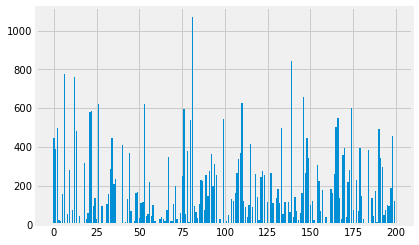

In [11]:
# what are scores for the features
for i in range(len(fs.scores_)):
    print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
plt.bar([i for i in range(len(fs.scores_))],fs.scores_)
plt.show()

#### Model Built Using All Features

In [12]:
#Let's scale the data

scaler = StandardScaler()
scaled_data = pd.DataFrame(scaler.fit_transform(X_train),columns=X_train.columns) #scaling the data


In [13]:
cols = X_train.columns

In [14]:


scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [15]:
X_train = pd.DataFrame(X_train,columns = [cols])
X_test = pd.DataFrame(X_test,columns = [cols])

In [16]:
#Balancing
# Install imblearn package - pip install imblearn

smote = SMOTE()
X_train, y_train = smote.fit_resample(X_train,y_train)

In [17]:

print("Actual Classes",Counter(y_train))
#print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({0: 143999, 1: 143999})


In [18]:
#Logistic Regression

model = LogisticRegression(solver='liblinear')
model.fit(X_train, y_train)
# evaluate the model
yhat = model.predict(X_test)
# evaluate predictions
accuracy = accuracy_score(y_test, yhat)
print('Accuracy: %.2f' % (accuracy*100))

Accuracy: 78.50


In [19]:
print(classification_report(y_test,yhat))

              precision    recall  f1-score   support

           0       0.97      0.79      0.87     35903
           1       0.29      0.76      0.42      4097

    accuracy                           0.78     40000
   macro avg       0.63      0.78      0.64     40000
weighted avg       0.90      0.78      0.82     40000



##### Model Built Using ANOVA f-test Features

In [20]:
# feature selection
def select_features(X_train, y_train, X_test):
    # configure to select a subset of features
    fs = SelectKBest(score_func=f_classif, k=100)
    # learn relationship from training data
    fs.fit(X_train, y_train)
    # transform train input data
    X_train_fs = fs.transform(X_train)
    # transform test input data
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs, fs

In [21]:

# feature selection


X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# fit the model
model1 = LogisticRegression(solver='liblinear')
model1.fit(X_train_fs, y_train)
# evaluate the model
yhat = model1.predict(X_test_fs)
# evaluate predictions
accuracy = accuracy_score(y_test, yhat)
print('Accuracy: %.2f' % (accuracy*100))

Accuracy: 77.24


In [22]:
print(classification_report(y_test,yhat))

              precision    recall  f1-score   support

           0       0.96      0.77      0.86     35903
           1       0.28      0.75      0.40      4097

    accuracy                           0.77     40000
   macro avg       0.62      0.76      0.63     40000
weighted avg       0.89      0.77      0.81     40000



##### Model Built Using Mutual Information Features

In [6]:
X = data.drop(['target'],axis=1)
y = data.target

In [7]:
# split into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [8]:
#Let's scale the data

scaler = StandardScaler()
scaled_data = pd.DataFrame(scaler.fit_transform(X_train),columns=X_train.columns) #scaling the data


In [9]:
cols = X_train.columns

In [10]:


scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [11]:
X_train = pd.DataFrame(X_train,columns = [cols])
X_test = pd.DataFrame(X_test,columns = [cols])

In [12]:
#Balancing
# Install imblearn package - pip install imblearn

smote = SMOTE()
X_train, y_train = smote.fit_resample(X_train,y_train)

In [13]:

print("Actual Classes",Counter(y_train))
#print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({0: 143999, 1: 143999})


In [16]:


# configure to select all features
fs = SelectKBest(score_func=mutual_info_classif, k='all')
# learn relationship from training data
fs.fit(X_train, y_train)
# transform train input data
X_train_fs = fs.transform(X_train)
# transform test input data
X_test_fs = fs.transform(X_test)

Feature 0: 0.002059
Feature 1: 0.001820
Feature 2: 0.001608
Feature 3: 0.001038
Feature 4: 0.000103
Feature 5: 0.000735
Feature 6: 0.002190
Feature 7: 0.000000
Feature 8: 0.000710
Feature 9: 0.001398
Feature 10: 0.000859
Feature 11: 0.000000
Feature 12: 0.004633
Feature 13: 0.001766
Feature 14: 0.000305
Feature 15: 0.001054
Feature 16: 0.000528
Feature 17: 0.000000
Feature 18: 0.000316
Feature 19: 0.001411
Feature 20: 0.000282
Feature 21: 0.002940
Feature 22: 0.001683
Feature 23: 0.000000
Feature 24: 0.001228
Feature 25: 0.000030
Feature 26: 0.001897
Feature 27: 0.001083
Feature 28: 0.000000
Feature 29: 0.000080
Feature 30: 0.000000
Feature 31: 0.000281
Feature 32: 0.001065
Feature 33: 0.000321
Feature 34: 0.000779
Feature 35: 0.000591
Feature 36: 0.000574
Feature 37: 0.000955
Feature 38: 0.000000
Feature 39: 0.000000
Feature 40: 0.002126
Feature 41: 0.000490
Feature 42: 0.000000
Feature 43: 0.000000
Feature 44: 0.002027
Feature 45: 0.001075
Feature 46: 0.000000
Feature 47: 0.000023
Fe

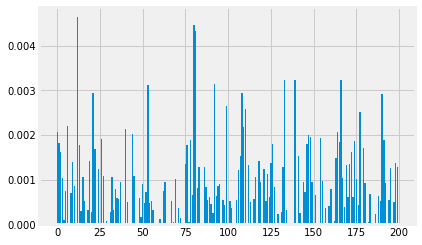

In [17]:
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# what are scores for the features
for i in range(len(fs.scores_)):
    print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

In [18]:
# fit the model
model2 = LogisticRegression(solver='liblinear')
model2.fit(X_train, y_train)
# evaluate the model
yhat = model2.predict(X_test)
# evaluate predictions
accuracy = accuracy_score(y_test, yhat)
print('Accuracy: %.2f' % (accuracy*100))

Accuracy: 91.27


##### Modeling With Selected Features

In [14]:
def select_features(X_train, y_train, X_test):
    # configure to select a subset of features
    fs = SelectKBest(score_func=mutual_info_classif, k=100)
    # learn relationship from training data
    fs.fit(X_train, y_train)
    # transform train input data
    X_train_fs = fs.transform(X_train)
    # transform test input data
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs, fs

In [15]:
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train, y_train, X_test)
# fit the model
model3 = LogisticRegression(solver='liblinear')
model3.fit(X_train_fs, y_train)
# evaluate the model
yhat = model3.predict(X_test_fs)
# evaluate predictions
accuracy = accuracy_score(y_test, yhat)
print('Accuracy: %.2f' % (accuracy*100))

Accuracy: 73.21


In [16]:
print(classification_report(y_test,yhat))

              precision    recall  f1-score   support

           0       0.96      0.73      0.83     35903
           1       0.24      0.72      0.35      4097

    accuracy                           0.73     40000
   macro avg       0.60      0.73      0.59     40000
weighted avg       0.88      0.73      0.78     40000



In [1]:
#Dimensionality reduction using information gain increased the accuracy.
#But overall score for 1 class is very poor.
#So reducing dimension does not help us in this case.

# Model Creation

Let's try the various ML algorithms on this data set without reducing the features.

# Logistic regression


In [30]:
X = data.drop(['target'],axis=1)
y = data.target

In [31]:
X.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697,2.4354,0.8194,16.5346,12.4205,-0.1

In [32]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

In [33]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42,stratify=y)

In [34]:
#Let's scale the data

scaler = StandardScaler()
scaled_data = pd.DataFrame(scaler.fit_transform(X_train),columns=X_train.columns) #scaling the data


In [35]:
cols = X_train.columns

In [36]:


scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [37]:
X_train = pd.DataFrame(X_train,columns = [cols])
X_test = pd.DataFrame(X_test,columns = [cols])

In [38]:
#Balancing
# Install imblearn package - pip install imblearn

smote = SMOTE()
X_train, y_train = smote.fit_resample(X_train,y_train)

In [39]:

print("Actual Classes",Counter(y_train))
#print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({0: 143922, 1: 143922})


In [40]:
#Logistic Regression


# define model
clf_lr = LogisticRegression(random_state=0,class_weight="balanced").fit(X_train, y_train)

preds_lr = clf_lr.predict(X_test)
print(classification_report(y_test, preds_lr))

print('AUC of test: ',roc_auc_score(y_test, preds_lr ));

print(confusion_matrix(y_test,preds_lr))

              precision    recall  f1-score   support

           0       0.97      0.79      0.87     35980
           1       0.29      0.76      0.42      4020

    accuracy                           0.79     40000
   macro avg       0.63      0.78      0.65     40000
weighted avg       0.90      0.79      0.83     40000

AUC of test:  0.777951819557023
[[28531  7449]
 [  953  3067]]


# Naive Bayes

In [61]:
#Naive Bayes
sample = class_weight.compute_sample_weight('balanced', y_train)
clf_nb = GaussianNB()
clf_nb.fit(X_train,y_train,sample_weight= sample)

GaussianNB()

In [62]:
preds_nb = clf_nb.predict(X_test)
print(classification_report(y_test, preds_nb))

print(confusion_matrix(y_test,preds_nb))

print('AUC of test: ',roc_auc_score(y_test, preds_nb ));

              precision    recall  f1-score   support

           0       0.97      0.81      0.89     35903
           1       0.33      0.80      0.46      4097

    accuracy                           0.81     40000
   macro avg       0.65      0.81      0.67     40000
weighted avg       0.91      0.81      0.84     40000

[[29196  6707]
 [  832  3265]]
AUC of test:  0.8050578385985655


# KNN

In [18]:
#KNN classifier
X = data.drop(columns ='target')
y = data.target

In [19]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.20,random_state =42)

In [20]:
#Scaling
cols = X_train.columns

In [22]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [23]:
X_train = pd.DataFrame(X_train,columns = [cols])

X_test = pd.DataFrame(X_test,columns = [cols])

In [24]:
X_train.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0.533571,-1.670477,-0.577120,0.618509,-1.263937,0.395017,-0.290156,1.350141,0.739687,0.804082,-1.730112,-0.305764,0.092685,0.164789,1.723864,0.414166,-1.525682,-0.606437,-0.418464,-0.989918,0.001759,1.305072,2.113500,-1.005522,-0.489549,1.864940,1.331988,1.106578,-0.406039,-0.089033,-2.053486,0.269603,0.278804,1.224833,-0.415202,-0.466996,1.062384,-0.744165,-0.887046,-0.001853,1.497617,-0.461349,-0.107402,-0.055885,-0.271677,0.586657,0.305691,-0.272440,-0.739730,-1.684972,0.463064,-1.612556,-1.642826,0.964352,0.810720,-0.075334,-0.379480,0.793356,1.149740,-0.761058,0.215741,0.419221,-0.035220,-0.666638,-1.198702,1.732524,-0.270510,1.458199,1.739024,0.471128,0.522967,1.200464,-0.669651,-1.266121,-1.379842,-1.601871,0.327419,0.777539,0.104093,0.152631,-0.520123,0.371911,-1.501261,-1.406883,-0.157149,0.730194,0.192297,0.994725,1.031651,-0.873570,1.006412,0.788910,-1.584870,0.052746,-1.198501,-0.972920,0.342825,1.579575,-1.997267,-0.585151,-0.683810,-0.064171,0.865206,-0.090491,0.540257,0.795783,2.368206,0.268602,-0.663650,-1.700058,0.099433,-1.105215,-0.888882,-0.940622,1.334502,1.980797,-1.914013,1.438834,-0.092424,-0.424352,1.714347,0.278120,0.775865,0.678642,-1.080812,0.865663,-2.146456,-1.225696,-1.876538,0.410747,-1.062508,-0.207420,1.443646,0.628017,-0.341453,0.300693,-1.146878,-0.416609,0.724558,-0.056078,-1.252999,-0.490021,0.427135,1.174176,0.260892,-0.003866,0.269156,-0.446145,-0.659253,1.703743,-0.398069,-0.854495,1.154176,-0.116514,1.490596,0.542036,-1.403380,0.116661,1.162522,1.364963,0.588027,-0.845885,1.173305,-1.442898,0.775983,-0.026550,0.926409,-0.055068,-0.475201,1.009605,-1.886484,1.635999,-0.726250,0.064758,-0.884282,0.060752,0.780180,1.198230,0.364876,1.960696,-0.392764,0.431237,-0.315146,0.030833,0.736845,0.267019,1.393692,-0.920971,1.227162,-1.096955,0.500929,0.169876,-0.682133,0.667273,-2.229998,-0.664679,-0.851566,-0.800368,-0.982862,0.134655
1,1.554858,1.089333,-0.538958,0.196006,-1.564960,0.066360,0.015289,-1.925062,1.135485,0.728461,-1.173668,0.672154,-1.258405,-0.967701,-0.930992,-1.687654,-0.284564,-1.594922,0.658702,0.724577,-0.231302,1.539591,2.365036,0.844725,-1.496400,-0.334143,-1.059894,0.357628,0.000086,-0.514480,-1.851401,-0.787821,0.384185,0.797490,0.386826,-1.885547,1.136263,-1.101492,-0.963325,-1.640349,-1.111802,0.701618,-0.467052,-0.286323,-0.523844,-0.207691,-0.474466,0.656233,0.895398,-0.902971,-0.370330,1.192959,0.745203,-0.669426,2.846120,0.601303,-0.785424,1.501553,-0.239500,0.864636,-1.599517,-0.052733,-1.333178,0.716

In [25]:
X_test.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0.105671,-0.710192,-0.625703,-0.179227,-0.228460,-1.298886,-0.328496,0.070361,1.171805,0.677130,-0.827311,-1.271327,1.213242,-1.171012,0.382483,0.304681,0.009110,-1.572725,1.270144,-0.891361,2.113443,1.090992,-0.414684,1.599590,-0.187719,-1.155559,0.636016,-1.150449,1.380937,-0.901159,-0.658812,-0.018807,-1.549986,0.010733,-1.284249,-1.887903,-1.588645,-1.142262,1.736308,-1.096313,0.997327,-1.410481,-0.641568,0.473091,-0.657935,0.651080,-0.651312,0.279566,-0.780503,-0.270205,0.640554,0.269849,-0.540540,0.112532,2.056323,-0.602030,-0.602844,0.460583,2.216765,0.302382,-0.772679,-0.436262,-2.588568,0.994804,1.123461,-0.221767,-0.531714,0.765515,-1.277054,0.951383,-0.708046,1.293184,1.293450,0.874030,1.918665,1.180071,0.898165,1.389679,1.036949,-1.056179,0.402929,-0.935353,-1.230979,1.736472,-0.755732,0.479653,-1.119115,-0.133346,0.480116,-0.079512,0.479816,-0.727631,0.108758,-0.294815,-0.855244,1.786697,0.908200,0.150852,-0.917944,-0.465160,-1.159538,0.617232,-0.707537,1.844170,0.663488,-2.162776,-0.605989,-1.220975,-1.574710,0.622322,1.125206,-1.196566,-1.409710,1.720841,0.139127,1.137680,-0.291488,-0.120412,0.461885,-0.754603,-1.063168,0.989341,1.088726,-1.520856,0.074213,-0.496731,-0.756280,0.800686,-0.378188,0.709826,2.055374,0.199010,1.032160,-0.435596,0.318241,-0.581099,1.490913,-0.860256,-0.325988,0.882625,-0.358126,1.558157,-1.128316,0.220020,0.309294,-2.213563,0.033476,0.087500,1.794865,-0.381579,-0.419362,-0.027782,-0.195311,1.047490,1.255814,-0.387891,-0.743136,1.561970,3.103581,-1.170419,1.433370,1.086110,0.794883,-0.149555,0.909784,0.380863,0.232225,0.151761,-0.575624,1.538802,0.104770,0.167830,-0.488954,-0.709276,0.712539,-1.210884,-0.721794,-1.136210,-0.421334,-0.610598,-1.201131,-0.022354,0.911784,-0.176931,-1.054871,0.453073,-1.405778,-1.169776,-1.094643,-1.287753,-0.890294,-1.365517,0.818046,0.442318,0.546771,-0.025844,0.648142,-0.079765,0.391736,1.164519
1,0.712420,-1.125748,-1.454241,-2.335155,1.060928,1.949670,-1.141708,-0.249467,-0.287630,1.083167,-1.502516,1.274997,-0.423645,-0.100293,0.519919,-0.593533,1.035015,-1.903553,1.636375,-0.196292,0.369326,2.641767,-1.132307,1.857349,-0.358702,0.735274,-0.337096,-1.642549,1.922990,-1.979078,0.143428,-0.019270,-1.051267,-0.530945,2.022821,-0.211614,-0.344099,0.674471,0.838884,-1.311633,0.232838,0.353511,-0.085731,-0.738164,0.426014,-0.968883,-1.077533,-2.074978,-0.468874,-1.719796,-1.794587,-1.276049,-0.968533,2.132253,-0.487861,1.214967,-1.018510,1.652024,-0.068210,0.260734,0.391068,-0.132870,0.85133

In [26]:
## taking optimal k to determine how many nearest neighbors  to create

# create a list to store the error values for each k

error_rate = []
for i in range (1,11):
    knn =KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_knn = knn.predict(X_test)
    error_rate.append(np.mean(pred_knn!=y_test))

Text(0, 0.5, 'Error Rate')

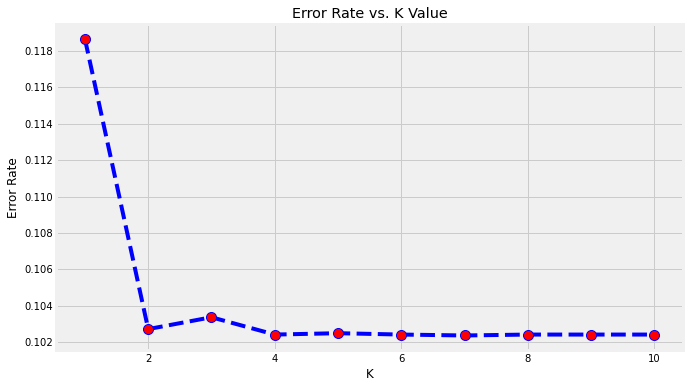

In [27]:
#Plot k value and error rate

plt.figure(figsize=(10,6))
plt.plot(range(1,11),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [66]:
# let's fit the data into KNN model and see how well it performs:

knn1 = KNeighborsClassifier(n_neighbors=5)

knn1.fit(X_train,y_train)

y_pred_knn1 = knn1.predict(X_test)

In [67]:
# Checking Accuracy score
print("The accuracy score is : ", accuracy_score(y_test,y_pred_knn1))

The accuracy score is :  0.8975


In [68]:
print(classification_report(y_test,y_pred_knn1))

              precision    recall  f1-score   support

           0       0.90      1.00      0.95     35903
           1       0.36      0.00      0.00      4097

    accuracy                           0.90     40000
   macro avg       0.63      0.50      0.47     40000
weighted avg       0.84      0.90      0.85     40000



In [14]:
#here 1 class has very bad performance so we can balance the data using SMOTE

smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_train,y_train)

In [15]:

print("Actual Classes",Counter(y_train))
print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({0: 143999, 1: 16001})
SMOTE Classes Counter({0: 143999, 1: 143999})


In [16]:
# let's fit the data into KNN model and see how well it performs:

knn2 = KNeighborsClassifier(n_neighbors=5)

knn2.fit(X_smote,y_smote)

y_pred_knn2 = knn2.predict(X_test)

In [17]:
print(classification_report(y_test,y_pred_knn2))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     35903
           1       0.10      1.00      0.19      4097

    accuracy                           0.10     40000
   macro avg       0.05      0.50      0.09     40000
weighted avg       0.01      0.10      0.02     40000



# Bagging

In [5]:
X = data.drop(['target'],axis=1)
y = data['target']

In [51]:
X.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697,2.4354,0.8194,16.5346,12.4205,-0.1

In [52]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

In [6]:
X_train,X_test,y_train,y_test = train_test_split(X,y,random_state=42,test_size = 0.20)

In [ ]:
#Balancing
# Install imblearn package - pip install imblearn

smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_train,y_train)

In [10]:

print("Actual Classes",Counter(y_train))
print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({0: 143999, 1: 16001})
SMOTE Classes Counter({0: 143999, 1: 143999})


In [11]:
X_smote.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,12.3039,-8.3899,9.1944,8.0649,9.0247,-1.9559,5.1565,21.1631,2.7437,8.5623,-9.1195,-5.0654,14.0421,9.3000,11.4089,14.7424,5.4342,-9.7680,11.9534,4.5106,13.3095,27.9682,10.3165,2.4899,8.7296,14.2002,3.8301,0.5474,5.2150,4.8237,-24.0381,10.9788,0.2066,20.0695,11.2086,1.4242,5.5014,4.1958,6.8433,0.6589,5.6651,6.5568,11.1473,11.5531,7.3427,-0.0842,12.1997,-15.3646,6.2595,3.4733,13.0607,0.2135,-10.7129,6.7462,7.9575,12.3231,15.2905,6.9028,8.1259,8.2786,13.0651,-7.0573,0.8042,-1.4144,4.5904,7.5408,5.4898,22.6662,5.0314,-1.4674,30.6800,0.9894,-1.9919,10.1476,0.0768,7.1550,8.6529,22.0321,5.5587,14.6022,1.9340,15.5740,-16.1919,-10.6353,-3.5609,21.2226,7.0983,16.9833,11.2724,0.6196,-3.3012,7.1083,6.1164,10.5857,7.6751,-0.6888,17.3231,38.4989,0.3197,-1.8338,-12.8622,13.0944,29.7810,1.5517,12.5723,4.9254,13.1096,19.8312,14.1109,11.0454,5.8945,5.1159,1.9047,3.9497,4.3944,7.4109,-0.7563,35.2509,-6.1138,1.2530,45.2935,11.7901,5.2077,11.2461,1.3214,12.7649,11.5355,-2.9932,-7.2103,17.1510,11.3732,0.4499,9.9041,7.0499,-6.9190,-1.9611,11.0662,13.9153,4.5072,7.3267,-2.7169,-0.3915,14.4144,15.7819,8.8884,4.8242,11.0201,-6.6141,3.8594,22.9874,15.8366,6.7619,11.0959,16.4918,14.3613,1.0610,11.8685,-4.1573,27.0787,15.8550,30.6330,5.4488,7.0295,3.4218,1.3661,19.1868,3.3058,-4.5841,3.4557,6.0094,-8.3475,7.9825,13.5424,-0.2908,13.9061,11.8151,3.0716,15.0284,2.1214,8.0848,-4.8168,10.6747,-2.1049,8.8938,19.6247,-2.7233,13.4097,-20.9951,20.2230,-0.3264,5.5185,7.9504,0.9184,5.9945,11.0078,-1.0936,-2.3412,8.1712,12.9046,-1.9309
1,15.4069,2.7820,9.2951,7.1997,8.5359,-4.5422,5.4210,9.9651,4.0623,8.4689,-6.0590,0.7759,13.7854,4.0456,5.4438,13.8766,8.6089,-16.3946,20.4100,18.2099,11.9410,29.8901,11.0320,3.4647,4.9191,13.5724,-10.3379,-0.5933,5.5332,3.7098,-22.4284,8.6950,0.4795,18.2231,11.6430,-5.9229,5.7317,3.3921,6.5169,-6.0109,-15.9492,13.4633,10.8967,11.4817,5.8531,-17.0826,9.9710,-5.5354,24.8797,9.6105,12.4841,23.1941,1.1884,5.4974,25.0889,16.1751,13.8542,7.4657,2.1566,9.6682,5.3921,-12.5515,-1.8242,2.8845,7.3799,3.0072,5.5351,6.7005,5.0175,-6.9759,35.1619,0.5474,3.6558,4.7186,26.2312,17.7479,2.5762,17.6092,7.2900,12.0023,4.6233,15.4917,-16.0852,0.0283,0.6900,16.8792,-2.6032,12.7591,9.3410,4.5268,-35.3936,6.8783,12.8642,11.2632,14.3005,1.2372,3.8808,12.1753,2.8357,-1.7214,-13.6862,10.6586,33.0855,1.5357,8.0175,4.4437,6.8451,18.9063,14.0519,18.5169,4.4499,5.4597,2.6370,10.8127,4.0149,5.4787,3.5881,12.7134,-11.2890,-0.2993,13.6128,12.1040,-4.0612,5.7758,3.0587,12.4330,12.2738,0.8791,-4.9605,16.127

In [12]:
y_smote.head()

0    0
1    0
2    0
3    1
4    0
Name: target, dtype: int64

In [43]:
cols = X_smote.columns

In [44]:


scaler = StandardScaler()

X_train = scaler.fit_transform(X_smote)

X_test = scaler.transform(X_test)

In [45]:
X_train = pd.DataFrame(X_smote,columns = [cols])
X_test = pd.DataFrame(X_test,columns = [cols])

In [22]:
X_test.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,-3.746907,0.138903,-4.623867,-3.702345,-7.512180,0.452007,-7.203164,-5.214382,0.288624,-5.802586,-0.251292,0.303528,-69.397021,-2.129294,-3.414906,-37.285417,-3.933062,0.638861,-1.931587,-1.796223,-1.984322,-1.964791,-1.856994,-2.538430,-3.107675,-56.482388,0.729583,-0.068089,-5.464253,-2.499930,0.929908,-5.157128,-0.549930,-3.556704,-24.948383,-1.265546,-1.256188,-3.423939,-2.212305,-0.482007,0.903126,-1.946211,-18.369827,-38.159167,-1.624918,0.672171,-4.558454,1.262950,-1.482250,-2.342456,-18.656900,-1.726890,0.371235,-8.299395,0.164763,-2.545482,-5.109489,-7.830154,-0.162815,-10.839599,-3.295625,1.022004,-1.976669,0.168977,-3.716290,-0.374028,-6.181163,-1.674321,-954.814888,1.148818,-2.251526,2.659697,0.231002,-2.670698,-1.337847,-2.660266,-0.579464,-4.934558,-2.364870,-12.859530,-0.671774,-6.842805,0.222711,0.126763,0.283367,-4.843628,-0.862184,-2.103170,-3.472001,-1.203990,1.303928,-54.831906,-3.127854,-21.007097,-4.669045,3.230553,-1.682134,-1.538533,-4.131661,0.014483,0.623347,-2.739272,-2.803366,2.546213,-5.843713,-8.307278,-5.299557,-2.606055,-98.087040,-4.216901,-1.293563,-7.596562,-3.324552,-1.487600,-3.107640,-0.316865,-1.712399,-1.289208,0.631858,-1.017460,-2.212160,-6.317181,0.060622,-1.410605,-1.667071,-43.776048,-19.474786,0.079705,0.195330,-3.805993,-12.993721,-0.613572,-4.876371,-20.671054,0.861571,0.462959,-2.180893,-2.247163,-0.407641,-0.803483,-0.861051,-0.151654,-2.445915,-4.388990,-9.776739,-2.028678,-4.145805,0.417473,-10.688666,-0.508538,-7.449523,-2.771362,-2.788914,-8.352641,-1.126372,0.245885,-15.737216,1.173006,-1.970185,-3.048554,-2.190662,-22.108519,-3.466752,-2.295372,0.682870,-3.882374,-7.458692,0.534484,-1.937903,-11.249727,-0.057531,0.176276,-2.423051,-0.087366,-2.754334,-4.841014,0.276245,-5.259466,0.101688,-1.302822,0.252015,-7.967227,0.039379,-2.138041,-1.630815,1.023133,-3.468561,0.802477,-4.387321,-2.395491,-1.058004,-3.178930,-0.646420,-0.732618,-5.915101,0.022635,-0.358089,-10.352792,-5.284246,0.410944
1,-3.526509,0.023489,-4.968565,-4.924192,-6.595883,0.912870,-8.240198,-5.324148,-0.223012,-5.429362,-0.393613,0.793190,-78.772759,-1.872607,-3.343199,-39.811666,-3.468113,0.581734,-1.880060,-1.697989,-2.327047,-1.756977,-2.134910,-1.974151,-3.159713,-48.764876,0.552950,-0.443709,-4.667071,-2.982652,1.044714,-5.157379,-0.328088,-3.698473,-18.033184,-0.897461,-0.802889,-2.483000,-2.456032,-0.543922,0.802647,-1.605595,-17.444031,-42.670705,-1.426282,0.591457,-4.731667,1.012440,-1.451993,-2.549555,-22.721653,-1.936265,0.272735,

In [7]:
cols = X_train.columns

In [8]:


scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

In [9]:
X_train = pd.DataFrame(X_train,columns = [cols])
X_test = pd.DataFrame(X_test,columns = [cols])

In [57]:
X_test.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0.105671,-0.710192,-0.625703,-0.179227,-0.228460,-1.298886,-0.328496,0.070361,1.171805,0.677130,-0.827311,-1.271327,1.213242,-1.171012,0.382483,0.304681,0.009110,-1.572725,1.270144,-0.891361,2.113443,1.090992,-0.414684,1.599590,-0.187719,-1.155559,0.636016,-1.150449,1.380937,-0.901159,-0.658812,-0.018807,-1.549986,0.010733,-1.284249,-1.887903,-1.588645,-1.142262,1.736308,-1.096313,0.997327,-1.410481,-0.641568,0.473091,-0.657935,0.651080,-0.651312,0.279566,-0.780503,-0.270205,0.640554,0.269849,-0.540540,0.112532,2.056323,-0.602030,-0.602844,0.460583,2.216765,0.302382,-0.772679,-0.436262,-2.588568,0.994804,1.123461,-0.221767,-0.531714,0.765515,-1.277054,0.951383,-0.708046,1.293184,1.293450,0.874030,1.918665,1.180071,0.898165,1.389679,1.036949,-1.056179,0.402929,-0.935353,-1.230979,1.736472,-0.755732,0.479653,-1.119115,-0.133346,0.480116,-0.079512,0.479816,-0.727631,0.108758,-0.294815,-0.855244,1.786697,0.908200,0.150852,-0.917944,-0.465160,-1.159538,0.617232,-0.707537,1.844170,0.663488,-2.162776,-0.605989,-1.220975,-1.574710,0.622322,1.125206,-1.196566,-1.409710,1.720841,0.139127,1.137680,-0.291488,-0.120412,0.461885,-0.754603,-1.063168,0.989341,1.088726,-1.520856,0.074213,-0.496731,-0.756280,0.800686,-0.378188,0.709826,2.055374,0.199010,1.032160,-0.435596,0.318241,-0.581099,1.490913,-0.860256,-0.325988,0.882625,-0.358126,1.558157,-1.128316,0.220020,0.309294,-2.213563,0.033476,0.087500,1.794865,-0.381579,-0.419362,-0.027782,-0.195311,1.047490,1.255814,-0.387891,-0.743136,1.561970,3.103581,-1.170419,1.433370,1.086110,0.794883,-0.149555,0.909784,0.380863,0.232225,0.151761,-0.575624,1.538802,0.104770,0.167830,-0.488954,-0.709276,0.712539,-1.210884,-0.721794,-1.136210,-0.421334,-0.610598,-1.201131,-0.022354,0.911784,-0.176931,-1.054871,0.453073,-1.405778,-1.169776,-1.094643,-1.287753,-0.890294,-1.365517,0.818046,0.442318,0.546771,-0.025844,0.648142,-0.079765,0.391736,1.164519
1,0.712420,-1.125748,-1.454241,-2.335155,1.060928,1.949670,-1.141708,-0.249467,-0.287630,1.083167,-1.502516,1.274997,-0.423645,-0.100293,0.519919,-0.593533,1.035015,-1.903553,1.636375,-0.196292,0.369326,2.641767,-1.132307,1.857349,-0.358702,0.735274,-0.337096,-1.642549,1.922990,-1.979078,0.143428,-0.019270,-1.051267,-0.530945,2.022821,-0.211614,-0.344099,0.674471,0.838884,-1.311633,0.232838,0.353511,-0.085731,-0.738164,0.426014,-0.968883,-1.077533,-2.074978,-0.468874,-1.719796,-1.794587,-1.276049,-0.968533,2.132253,-0.487861,1.214967,-1.018510,1.652024,-0.068210,0.260734,0.391068,-0.132870,0.85133

In [58]:
X_train.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0.533571,-1.670477,-0.577120,0.618509,-1.263937,0.395017,-0.290156,1.350141,0.739687,0.804082,-1.730112,-0.305764,0.092685,0.164789,1.723864,0.414166,-1.525682,-0.606437,-0.418464,-0.989918,0.001759,1.305072,2.113500,-1.005522,-0.489549,1.864940,1.331988,1.106578,-0.406039,-0.089033,-2.053486,0.269603,0.278804,1.224833,-0.415202,-0.466996,1.062384,-0.744165,-0.887046,-0.001853,1.497617,-0.461349,-0.107402,-0.055885,-0.271677,0.586657,0.305691,-0.272440,-0.739730,-1.684972,0.463064,-1.612556,-1.642826,0.964352,0.810720,-0.075334,-0.379480,0.793356,1.149740,-0.761058,0.215741,0.419221,-0.035220,-0.666638,-1.198702,1.732524,-0.270510,1.458199,1.739024,0.471128,0.522967,1.200464,-0.669651,-1.266121,-1.379842,-1.601871,0.327419,0.777539,0.104093,0.152631,-0.520123,0.371911,-1.501261,-1.406883,-0.157149,0.730194,0.192297,0.994725,1.031651,-0.873570,1.006412,0.788910,-1.584870,0.052746,-1.198501,-0.972920,0.342825,1.579575,-1.997267,-0.585151,-0.683810,-0.064171,0.865206,-0.090491,0.540257,0.795783,2.368206,0.268602,-0.663650,-1.700058,0.099433,-1.105215,-0.888882,-0.940622,1.334502,1.980797,-1.914013,1.438834,-0.092424,-0.424352,1.714347,0.278120,0.775865,0.678642,-1.080812,0.865663,-2.146456,-1.225696,-1.876538,0.410747,-1.062508,-0.207420,1.443646,0.628017,-0.341453,0.300693,-1.146878,-0.416609,0.724558,-0.056078,-1.252999,-0.490021,0.427135,1.174176,0.260892,-0.003866,0.269156,-0.446145,-0.659253,1.703743,-0.398069,-0.854495,1.154176,-0.116514,1.490596,0.542036,-1.403380,0.116661,1.162522,1.364963,0.588027,-0.845885,1.173305,-1.442898,0.775983,-0.026550,0.926409,-0.055068,-0.475201,1.009605,-1.886484,1.635999,-0.726250,0.064758,-0.884282,0.060752,0.780180,1.198230,0.364876,1.960696,-0.392764,0.431237,-0.315146,0.030833,0.736845,0.267019,1.393692,-0.920971,1.227162,-1.096955,0.500929,0.169876,-0.682133,0.667273,-2.229998,-0.664679,-0.851566,-0.800368,-0.982862,0.134655
1,1.554858,1.089333,-0.538958,0.196006,-1.564960,0.066360,0.015289,-1.925062,1.135485,0.728461,-1.173668,0.672154,-1.258405,-0.967701,-0.930992,-1.687654,-0.284564,-1.594922,0.658702,0.724577,-0.231302,1.539591,2.365036,0.844725,-1.496400,-0.334143,-1.059894,0.357628,0.000086,-0.514480,-1.851401,-0.787821,0.384185,0.797490,0.386826,-1.885547,1.136263,-1.101492,-0.963325,-1.640349,-1.111802,0.701618,-0.467052,-0.286323,-0.523844,-0.207691,-0.474466,0.656233,0.895398,-0.902971,-0.370330,1.192959,0.745203,-0.669426,2.846120,0.601303,-0.785424,1.501553,-0.239500,0.864636,-1.599517,-0.052733,-1.333178,0.716

In [59]:


model_bagg=BaggingClassifier(base_estimator=clf_lr,n_estimators=100)
model_bagg.fit(X_train,y_train)

y_hat_bagg=model_bagg.predict(X_test)

In [60]:
print(classification_report(y_test,y_hat_bagg))

              precision    recall  f1-score   support

           0       0.97      0.78      0.86     35903
           1       0.29      0.77      0.42      4097

    accuracy                           0.78     40000
   macro avg       0.63      0.78      0.64     40000
weighted avg       0.90      0.78      0.82     40000



In [63]:
#Naive bayes bagging
model_bagg1=BaggingClassifier(base_estimator=clf_nb,n_estimators=100)
model_bagg1.fit(X_train,y_train)

y_hat_bagg=model_bagg1.predict(X_test)

In [64]:
print(classification_report(y_test,y_hat_bagg))

              precision    recall  f1-score   support

           0       0.93      0.98      0.96     35903
           1       0.72      0.37      0.49      4097

    accuracy                           0.92     40000
   macro avg       0.83      0.68      0.72     40000
weighted avg       0.91      0.92      0.91     40000



# ANN

In [17]:
## creating independent and dependent variables
X = data.drop(columns = 'target',axis=1)
y = data.target

In [18]:
## Scaling the data as the magnitude of variables are varying lot
sc=StandardScaler() ## object creation
scaled_x=sc.fit_transform(X) ## transforming the data
X = pd.DataFrame(scaled_x,columns=X.columns) ##converting the arrays
## to dataframe

In [19]:
#Balancing
# Install imblearn package - pip install imblearn
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_train,y_train)

In [20]:
print("Actual Classes",Counter(y_train))
print("SMOTE Classes",Counter(y_smote))

Actual Classes Counter({0: 143999, 1: 143999})
SMOTE Classes Counter({0: 143999, 1: 143999})


In [8]:
X.head()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,-0.577102,-1.273737,0.451707,-0.833709,0.235571,-0.536430,-0.334926,0.608751,-1.561580,-1.473796,0.460091,1.076623,-0.054077,-1.714773,0.561098,-0.009778,-1.401636,-0.229802,-1.395940,2.285292,-0.468989,-0.126734,-0.606166,-1.039947,1.005683,-0.823003,-0.184673,0.479492,-0.768964,0.360340,0.926437,1.162587,-1.299824,0.489773,-0.447275,1.300500,-0.484245,0.897088,-1.396490,0.789254,0.179582,-0.324223,0.509123,1.533101,0.456291,0.265485,-1.889139,-0.164640,0.116264,-1.445719,0.257933,1.907481,0.368029,-1.091818,-0.223968,0.366666,-1.514722,-1.119228,-0.269821,1.386852,0.953771,1.454518,0.593678,-0.281577,1.551733,2.257770,0.010310,1.424133,-1.112326,-0.346204,-0.235063,-0.387918,1.155818,-1.439925,1.671834,0.252319,-1.057511,1.137827,0.587034,-1.683537,1.055809,-0.383475,0.570662,0.230979,-0.310201,0.794207,0.477536,0.902216,-0.282776,-1.525640,-0.372640,-1.355746,-0.393474,-1.040675,1.388299,0.427522,-0.637653,-0.180540,0.589925,-1.431860,1.750971,-0.020872,0.491726,-0.692321,1.624026,2.104318,0.488124,-0.084272,-0.666520,1.355837,-0.910467,0.413522,0.374729,-1.933508,-0.565450,-0.268672,0.090272,-0.039634,-0.922462,1.013930,-0.702227,-0.923810,-0.058680,-1.024974,-0.018613,-1.525514,0.843723,-0.505249,-0.245997,-0.003412,0.686795,-0.407587,1.270955,-0.654603,1.621549,0.970629,0.624732,1.551190,0.355273,1.027749,1.002196,-1.265512,1.243501,-0.363716,0.055578,0.904803,0.486218,-1.776800,0.191144,1.215988,0.689904,0.161129,0.456650,-0.015640,0.707191,0.646555,-1.082956,-1.493440,-0.039210,0.319925,-0.808962,-1.468275,-1.230618,-1.133356,1.749415,-1.323871,-0.711244,0.442890,1.500647,-0.400904,-1.075697,-1.411980,0.122226,0.642079,-0.231051,-1.347890,-0.974846,0.700359,-0.291946,-0.311275,-1.076447,-0.779321,0.261797,1.251424,1.404031,2.086632,0.900016,-0.810464,0.556997,-0.164257,0.263374,-1.149158,0.817469,-0.411013,0.168705,-1.578117,1.022131,-0.373968,-1.026398,0.214135
1,0.269959,-0.622138,1.190360,-0.688846,0.790975,1.539900,0.244461,-0.003525,0.858974,0.419300,-0.144987,1.893408,-0.000409,-0.025160,-0.935586,-2.120000,1.757336,-1.473077,-0.948119,2.017368,-1.678317,-1.771135,1.491237,0.668183,-0.954799,0.782756,-1.302434,-0.932390,-0.621140,-1.722433,-0.202250,-1.165592,0.695096,1.063517,-0.118257,-0.599010,0.196242,-0.011334,0.040634,0.741083,-0.530145,-1.250719,-1.932294,0.692012,-1.305067,-1.620194,-1.382515,1.197234,1.730162,1.148358,-1.310794,-0.024833,-0.316814,0.889088,-1.097157,1.028750,0.760624,0.930521,-0.292466,-0.073613,-0.981607,0.404807,0.454158,

In [9]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

In [21]:
##creating training and test data
X_train,X_test,y_train,y_test = train_test_split(X,y,
                                test_size=0.2,random_state=10)

In [22]:
# model creation

model = MLPClassifier( hidden_layer_sizes=(50,3),
                       learning_rate_init=0.1,
                       max_iter=100,
                       random_state=2) ## model object creation max_iter=Stopping parameter
model.fit(X_train,y_train) ## training the data
y_predict_proba = model.predict_proba(X_test) ## predicting the pro
## Probability of class
y_predict = model.predict(X_test)
y_train_predict = model.predict(X_train)


In [11]:
y_predict_proba

array([[0.89952316, 0.10047684],
       [0.89952316, 0.10047684],
       [0.89952316, 0.10047684],
       ...,
       [0.89952316, 0.10047684],
       [0.89952316, 0.10047684],
       [0.89952316, 0.10047684]])

In [38]:
## Evaluating the model created
print("Train accuracy :",accuracy_score(y_train,y_train_predict))
print("Test accuracy :",accuracy_score(y_test,y_predict))

Train accuracy : 0.8994
Test accuracy : 0.89995


In [39]:
## getting the confusion matrix
pd.crosstab(y_test,y_predict)

col_0,0
target,
0,35998
1,4002


In [40]:
## getting classification report
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.90      1.00      0.95     35998
           1       0.00      0.00      0.00      4002

    accuracy                           0.90     40000
   macro avg       0.45      0.50      0.47     40000
weighted avg       0.81      0.90      0.85     40000



# Random Forest


In [22]:
X = data.drop('target', axis=1)
y = data.target

In [23]:
## Balacing the data

sm=SMOTE()
print(Counter(y))
X_sm,y_sm=sm.fit_resample(X,y)
print(Counter(y_sm))

Counter({0: 179902, 1: 20098})
Counter({0: 179902, 1: 179902})


In [17]:

X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.25, random_state=42)

In [18]:

# Model creation

rf_clf = RandomForestClassifier(n_estimators=100)


rf_clf.fit(X_train,y_train)


y_predict=rf_clf.predict(X_test)

In [19]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97     45034
           1       0.98      0.95      0.97     44917

    accuracy                           0.97     89951
   macro avg       0.97      0.97      0.97     89951
weighted avg       0.97      0.97      0.97     89951



In [20]:
## checking cross validation score dt1
scores = cross_val_score(rf_clf,X,y,cv=5,scoring='accuracy')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())
#std of < 0.05 is good.

[0.89955  0.8996   0.89955  0.8995   0.899525]
Cross validation Score: 0.899545
Std : 3.316624790354365e-05


In [21]:
y_train_predict = rf_clf.predict(X_train)

In [24]:
print(classification_report(y_train,y_train_predict))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    134868
           1       1.00      1.00      1.00    134985

    accuracy                           1.00    269853
   macro avg       1.00      1.00      1.00    269853
weighted avg       1.00      1.00      1.00    269853



In [24]:
# The above model is over fitted 

In [ ]:
# After applying many algorithms there is not much good score obtained.
#Therefor we should do feature engineering with other methods.
#Let's do feature engineering again and check the scores.

## Feature Selection and Model creation using another approach

### Feature Scaling

In [4]:
data = pd.read_csv("transaction.csv")
pd.set_option('display.max_columns',None)
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.2840,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.8000,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697

#### Robust Scaling

* Here we are using robust scaling because the data set contain the outlier but feature is follow a normal distribution
* robust scaler is similar to normalization but it instead uses the interquatile range, so that is robust to outlier

In [5]:

scaler = RobustScaler() # Object creation
data[['var_0','var_1','var_2','var_3','var_4','var_5','var_6','var_7','var_8','var_9','var_10','var_11','var_12','var_13',
      'var_14','var_15','var_16','var_17','var_18','var_19','var_20','var_21','var_22','var_23','var_24','var_25','var_26',
      'var_27','var_28','var_29','var_30','var_31','var_32','var_33','var_34','var_35','var_36','var_37','var_38','var_39',
      'var_40','var_41','var_42','var_43','var_44','var_45','var_46','var_47','var_48','var_49','var_50','var_51','var_52',
      'var_53','var_54','var_55','var_56','var_57','var_58','var_59','var_60','var_61','var_62','var_63','var_64','var_65',
      'var_66','var_67','var_68','var_69','var_70','var_71','var_72','var_73','var_74','var_75','var_76','var_77','var_78',
      'var_79','var_80','var_81','var_82','var_83','var_84','var_85','var_86','var_87','var_88','var_89','var_90','var_91',
      'var_92','var_93','var_94','var_95','var_96','var_97','var_98','var_99','var_100','var_101','var_102','var_103',
      'var_104','var_105','var_106','var_107','var_108','var_109','var_110','var_111','var_112','var_113','var_114',
      'var_115','var_116','var_117','var_118','var_119','var_120','var_121','var_122','var_123','var_124','var_125',
      'var_126','var_127','var_128','var_129','var_130','var_131','var_132','var_133','var_134','var_135','var_136','var_137',
      'var_138','var_139','var_140','var_141','var_142','var_143','var_144','var_145','var_146','var_147','var_148','var_149',
      'var_150','var_151','var_152','var_153','var_154','var_155','var_156','var_157','var_158','var_159','var_160','var_161',
      'var_162','var_163','var_164','var_165','var_166','var_167','var_168','var_169','var_170','var_171','var_172','var_173',
      'var_174','var_175','var_176','var_177','var_178','var_179','var_180','var_181','var_182','var_183','var_184','var_185',
      'var_186','var_187','var_188','var_189','var_190','var_191','var_192','var_193','var_194','var_195','var_196','var_197',
      'var_198','var_199',]] = scaler.fit_transform(data[['var_0','var_1','var_2','var_3','var_4','var_5','var_6','var_7',
      'var_8','var_9','var_10','var_11','var_12','var_13',
      'var_14','var_15','var_16','var_17','var_18','var_19','var_20','var_21','var_22','var_23','var_24','var_25','var_26',
      'var_27','var_28','var_29','var_30','var_31','var_32','var_33','var_34','var_35','var_36','var_37','var_38','var_39',
      'var_40','var_41','var_42','var_43','var_44','var_45','var_46','var_47','var_48','var_49','var_50','var_51','var_52',
      'var_53','var_54','var_55','var_56','var_57','var_58','var_59','var_60','var_61','var_62','var_63','var_64','var_65',
      'var_66','var_67','var_68','var_69','var_70','var_71','var_72','var_73','var_74','var_75','var_76','var_77','var_78',
      'var_79','var_80','var_81','var_82','var_83','var_84','var_85','var_86','var_87','var_88','var_89','var_90','var_91',
      'var_92','var_93','var_94','var_95','var_96','var_97','var_98','var_99','var_100','var_101','var_102','var_103',
      'var_104','var_105','var_106','var_107','var_108','var_109','var_110','var_111','var_112','var_113','var_114',
      'var_115','var_116','var_117','var_118','var_119','var_120','var_121','var_122','var_123','var_124','var_125',
      'var_126','var_127','var_128','var_129','var_130','var_131','var_132','var_133','var_134','var_135','var_136','var_137',
      'var_138','var_139','var_140','var_141','var_142','var_143','var_144','var_145','var_146','var_147','var_148','var_149',
      'var_150','var_151','var_152','var_153','var_154','var_155','var_156','var_157','var_158','var_159','var_160','var_161',
      'var_162','var_163','var_164','var_165','var_166','var_167','var_168','var_169','var_170','var_171','var_172','var_173',
      'var_174','var_175','var_176','var_177','var_178','var_179','var_180','var_181','var_182','var_183','var_184','var_185',
      'var_186','var_187','var_188','var_189','var_190','var_191','var_192','var_193','var_194','var_195','var_196','var_197',
      'var_198','var_199']])

In [31]:
data.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,-1.011036,-0.957762,0.305583,0.773493,-0.043671,-1.114937,0.366513,-0.008174,-0.966624,-0.162739,-0.922003,1.501988,-0.287712,-0.087983,-0.412584,-0.697739,0.682295,-0.564694,-0.115641,0.311940,-0.548520,0.288457,0.576435,0.841940,-0.851126,0.348616,-0.299471,0.903673,-0.340591,0.581356,-0.981379,0.548539,0.115367,-0.193612,0.319345,1.040799,0.283599,0.173463,-1.324016,-0.105497,0.088093,-0.953893,0.180010,1.287471,0.258004,-0.771426,-0.161079,0.250831,-1.036505,-0.760518,-0.191132,0.969281,0.663865,0.953312,0.457902,-0.194641,1.045515,1.563864,0.014637,1.021941,-0.811881,-0.235622,-0.152782,-0.260393,0.797759,-0.940584,1.177347,0.171753,-0.770042,0.737181,0.354058,-1.091074,0.705281,-0.322230,0.354930,0.149136,-0.217689,0.526629,0.308423,0.631770,-0.169341,-1.068672,-0.245199,-0.889417,-0.256259,-0.788603,0.905459,0.326678,-0.415107,-0.116685,0.408769,-1.002733,1.191061,-0.009283,0.334864,-0.454611,1.145443,1.539743,0.354209,-0.037369,-0.441993,0.901512,-0.635917,0.267546,0.203524,-1.270972,-0.393360,-0.198976,0.038224,-0.019047,-0.655480,0.678865,-0.479367,-0.576777,-0.040617,-0.724279,-0.020919,-1.020520,0.573672,-0.345920,-0.166804,0.003252,0.448584,-0.285488,0.842093,-0.453821,1.045512,0.653827,0.403910,1.027436,0.252403,0.700201,0.661924,-0.828965,0.881523,-0.262672,0.034931,0.598285,0.337620,-1.233241,0.117986,0.866341,0.477374,0.108810,0.313432,0.015391,0.469908,0.456423,-0.694127,-1.039317,-0.002129,0.226414,-0.496664,-0.995956,-0.852672,-0.757186,1.106464,-0.907538,-0.478894,0.302331,1.120384,-0.275810,-0.750177,-0.992302,0.092748,0.431413,-0.155465,-0.900226,-0.683989,0.481938,-0.202353,-0.210354,-0.745271,-0.529248,0.172926,0.860504,0.965631,1.451151,0.656221,-0.535886,0.399552,-0.106880,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,train_1,0,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,0.523831,0.231733,-0.111621,1.356555,-0.005922,-0.026486,-0.597899,-1.428478,1.275230,-1.026186,-0.624927,1.325749,-1.055828,-1.256152,1.040491,0.471547,-0.579970,0.561012,-0.919817,-0.613938,-0.443401,-1.213627,-0.153128,-0.825920,0.449260,0.722049,-0.080039,-0.431143,0.134638,-0.016755,0.042161,0.514962,-0.376309,-0.789331,-1.308709,0.475694,-1.053919,-1.092571,-0.967908,0.772529,1.189818,0.759215,-0.943863,-0.018056,-0.229100,0.596677,-0.746539,0.673046,0.514992,0.647343,-0.207278,-0.026

In [6]:
# DROP UNIQUE AND CONSTANT FEATURE
data.drop('ID_code',axis=1,inplace=True)

In [33]:
data.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,-1.011036,-0.957762,0.305583,0.773493,-0.043671,-1.114937,0.366513,-0.008174,-0.966624,-0.162739,-0.922003,1.501988,-0.287712,-0.087983,-0.412584,-0.697739,0.682295,-0.564694,-0.115641,0.311940,-0.548520,0.288457,0.576435,0.841940,-0.851126,0.348616,-0.299471,0.903673,-0.340591,0.581356,-0.981379,0.548539,0.115367,-0.193612,0.319345,1.040799,0.283599,0.173463,-1.324016,-0.105497,0.088093,-0.953893,0.180010,1.287471,0.258004,-0.771426,-0.161079,0.250831,-1.036505,-0.760518,-0.191132,0.969281,0.663865,0.953312,0.457902,-0.194641,1.045515,1.563864,0.014637,1.021941,-0.811881,-0.235622,-0.152782,-0.260393,0.797759,-0.940584,1.177347,0.171753,-0.770042,0.737181,0.354058,-1.091074,0.705281,-0.322230,0.354930,0.149136,-0.217689,0.526629,0.308423,0.631770,-0.169341,-1.068672,-0.245199,-0.889417,-0.256259,-0.788603,0.905459,0.326678,-0.415107,-0.116685,0.408769,-1.002733,1.191061,-0.009283,0.334864,-0.454611,1.145443,1.539743,0.354209,-0.037369,-0.441993,0.901512,-0.635917,0.267546,0.203524,-1.270972,-0.393360,-0.198976,0.038224,-0.019047,-0.655480,0.678865,-0.479367,-0.576777,-0.040617,-0.724279,-0.020919,-1.020520,0.573672,-0.345920,-0.166804,0.003252,0.448584,-0.285488,0.842093,-0.453821,1.045512,0.653827,0.403910,1.027436,0.252403,0.700201,0.661924,-0.828965,0.881523,-0.262672,0.034931,0.598285,0.337620,-1.233241,0.117986,0.866341,0.477374,0.108810,0.313432,0.015391,0.469908,0.456423,-0.694127,-1.039317,-0.002129,0.226414,-0.496664,-0.995956,-0.852672,-0.757186,1.106464,-0.907538,-0.478894,0.302331,1.120384,-0.275810,-0.750177,-0.992302,0.092748,0.431413,-0.155465,-0.900226,-0.683989,0.481938,-0.202353,-0.210354,-0.745271,-0.529248,0.172926,0.860504,0.965631,1.451151,0.656221,-0.535886,0.399552,-0.106880,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,0,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,0.523831,0.231733,-0.111621,1.356555,-0.005922,-0.026486,-0.597899,-1.428478,1.275230,-1.026186,-0.624927,1.325749,-1.055828,-1.256152,1.040491,0.471547,-0.579970,0.561012,-0.919817,-0.613938,-0.443401,-1.213627,-0.153128,-0.825920,0.449260,0.722049,-0.080039,-0.431143,0.134638,-0.016755,0.042161,0.514962,-0.376309,-0.789331,-1.308709,0.475694,-1.053919,-1.092571,-0.967908,0.772529,1.189818,0.759215,-0.943863,-0.018056,-0.229100,0.596677,-0.746539,0.673046,0.514992,0.647343,-0.207278,-0.026154,-0.653387,0.263081,0

In [34]:
## Checking Correlation
data.corr()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
target,1.000000,0.052390,0.050343,0.055870,0.011055,0.010915,0.030979,6.673085e-02,-0.003025,0.019584,-0.042805,-0.002213,0.022993,-6.948928e-02,-0.055156,-0.006332,0.017283,0.008117,0.000864,0.043479,0.011291,-0.018329,-0.058483,0.060558,-0.025473,0.028477,0.013328,0.062422,-5.818916e-04,-0.023942,0.004682,0.000638,-0.025619,0.030513,-0.044334,-0.052692,0.036567,-0.038397,0.007685,0.000970,-0.004090,0.049530,-0.001298,-0.008365,-0.028557,-4.903939e-02,-0.020065,0.005690,0.008983,0.032334,0.030612,-0.013900,0.025992,0.027754,0.063399,-0.015796,0.017176,-0.035000,-0.015468,-0.024277,-0.010448,0.006265,0.007407,0.013888,-0.014670,-0.013805,0.011214,0.023114,0.044673,-0.011957,0.008283,0.026748,0.033607,-0.013005,-0.006460,0.019926,-3.808113e-02,-0.061917,-0.017459,0.048245,0.007591,-0.057609,-0.080917,0.022574,-0.020528,0.012363,-0.024513,-0.039126,-0.035860,-0.020677,0.039369,0.029395,0.040127,-0.046295,-0.035070,0.046296,0.038531,0.003037,0.015224,-0.004074,0.058367,2.215327e-03,-0.009138,-0.018329,-0.001395,-0.026605,0.025604,0.032947,-0.039997,-0.044791,-4.992600e-02,0.064275,0.026686,0.023694,-0.013681,-0.026266,-0.050174,-2.344771e-02,0.002591,0.040358,0.030975,-0.010895,-0.039788,-0.042461,-0.040291,0.004218,0.028223,1.392930e-03,-0.039125,0.026909,-0.005880,0.029917,-0.032380,-0.024510,0.054548,0.017213,0.027944,-0.003554,0.027190,0.018328,-0.074080,0.015301,-0.029701,-1.890064e-02,-0.011202,2.120786e-02,0.030917,-0.063644,0.040280,-0.055011,-0.047319,-2.582110e-02,0.027524,-0.010773,-0.007103,-0.046106,0.037240,-0.020997,0.032642,-0.003817,0.015278,-0.005135,0.004168,0.032647,0.031811,0.040997,-0.055734,-0.057773,0.030797,0.014115,-0.048382,0.047973,0.014873,-0.037976,4.202224e-02,-0.061669,0.021692,0.007469,-3.686307e-02,-0.019681,0.050002,0.031190,1.371375e-02,-0.007198,-0.005467,0.048315,0.000053,-0.030421,0.014873,-0.034015,0.009212,0.055973,4.711368e-02,-0.042858,-0.017709,-0.022838,0.028285,0.023608,-0.035303,-0.053000,0.025434
var_0,0.052390,1.000000,-0.000544,0.006573,0.003801,0.001326,0.003046,6.982549e-03,0.002429,0.004962,-0.002613,0.000355,0.003468,-1.995731e-03,-0.002717,-0.004584,-0.000043,0.001112,-0.001664,0.004292,0.001505,-0.000932,0.000781,0.002322,-0.000987,0.003658,0.001158,0.006117,9.846974e-04,0.001081,-0.000426,0.003187,-0.002097,0.000274,-0.003343,-0.003933,0.001469,-0.002556,-0.000253,-0.000470,-0.001409,0.006798,0.001152,-0.000440,0.002685,-3.003208e-03,-0.001539,0.000129,0.004062,0.003767,0.000524,-0.004678,0.001217,0.00303

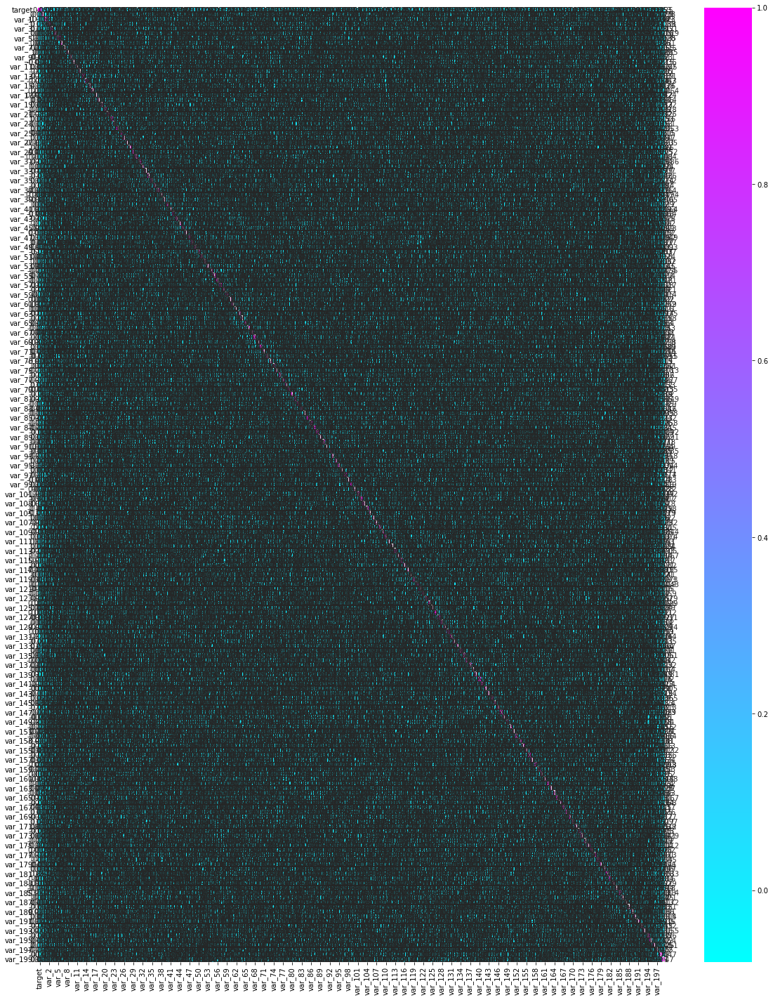

In [20]:
# Plot heatmap for better visualisation
plt.figure(figsize=(20,25))
sns.heatmap(data.corr(),annot=True,cmap='cool')
plt.show()

In [21]:
# To get highly correlated features
pd.set_option('display.max_rows',None)
corrmat = data.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.9] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat

,feature1,feature2,corr


There  is no highly correlated feature in dataset

In [22]:
## Checking Duplicates
data.duplicated().sum()

0

### PRINCIPLE COMPONENT ANALYSIS

#### Reduce the feature with the help of pca

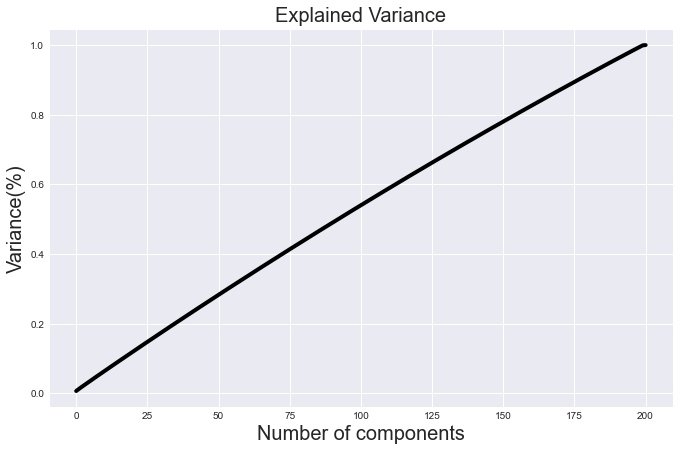

In [7]:
# Getting the optimal value of pca

pca = PCA() # Object creation
principlecomponent = pca.fit_transform(data)  # Fitting the data
plt.figure(figsize=(10,7))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_),color ='k')
plt.xlabel('Number of components',fontsize=20)
plt.ylabel('Variance(%)',fontsize=20) # for each component
plt.title('Explained Variance',fontsize=20)
plt.show()

* In this plot we cleary seen the line of no of components is straight means the feature is more important so we are going to select 175 feature because of less variance loss

In [8]:
# Selecting the components
pca = PCA(n_components=175)
new_data = pca.fit_transform(data)
new_data

array([[-0.51758867,  0.26955976,  0.05402251, ...,  0.91197506,
         0.02825685, -0.01823824],
       [ 1.32400732, -0.53357927,  1.95817087, ...,  0.11897006,
        -0.04993349, -0.091531  ],
       [-0.04224386, -0.81522866, -0.3257926 , ...,  0.04433698,
        -1.15220835, -0.52020052],
       ...,
       [ 0.01423866,  0.55522966,  0.65142503, ...,  0.13624811,
        -0.40374922,  0.61777042],
       [-0.40689894,  0.23820526,  0.38221209, ..., -0.55847262,
         0.11239184, -0.75789081],
       [-0.76575485, -0.16503883,  0.39951196, ...,  1.09182605,
        -0.47622989,  0.67725346]])

In [9]:
# Create a new dataframe
principle_df = pd.DataFrame(data=new_data,columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7','pca8','pca9','pca10',
                            'pca11','pca12','pca13','pca14','pca15','pca16','pca17','pca18','pca19','pca20','pca21','pca22',
                            'pca23','pca24','pca25','pca26','pca27','pca28','pca29','pca30','pca31','pca32','pca33','pca34',
                            'pca35','pca36','pca37','pca38','pca39','pca40','pca41','pca42','pca43','pca44','pca45','pca46',
                            'pca47','pca48','pca49','pca50','pca51','pca52','pca53','pca54','pca55','pca56','pca57','pca58',
                            'pca59','pca60','pca61','pca62','pca63','pca64','pca65','pca66','pca67','pca68','pca69','pca70',
                            'pca71','pca72','pca73','pca74','pca75','pca76','pca77','pca78','pca79','pca80','pca81','pca82',
                            'pca83','pca84','pca85','pca86','pca87','pca88','pca89','pca90','pca91','pca92','pca93','pca94',
                            'pca95','pca96','pca97','pca98','pca99','pca100','pca101','pca102','pca103','pca104','pca105',
                            'pca106','pca107','pca108','pca109','pca110','pca111','pca112','pca113','pca114','pca115','pca116',
                            'pca117','pca118','pca119','pca120','pca121','pca122','pca123','pca124','pca125','pca126','pca127',
                            'pca128','pca129','pca130','pca131','pca132','pca133','pca134','pca135','pca136','pca137','pca138',
                            'pca139','pca140','pca141','pca142','pca143','pca144','pca145','pca146','pca147','pca148','pca149',
                            'pca150','pca151','pca152','pca153','pca154','pca155','pca156','pca157','pca158','pca159','pca160',
                            'pca161','pca162','pca163','pca164','pca165','pca166','pca167','pca168','pca169','pca170',
                            'pca171','pca172','pca173','pca174','pca175'])
principle_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25,pca26,pca27,pca28,pca29,pca30,pca31,pca32,pca33,pca34,pca35,pca36,pca37,pca38,pca39,pca40,pca41,pca42,pca43,pca44,pca45,pca46,pca47,pca48,pca49,pca50,pca51,pca52,pca53,pca54,pca55,pca56,pca57,pca58,pca59,pca60,pca61,pca62,pca63,pca64,pca65,pca66,pca67,pca68,pca69,pca70,pca71,pca72,pca73,pca74,pca75,pca76,pca77,pca78,pca79,pca80,pca81,pca82,pca83,pca84,pca85,pca86,pca87,pca88,pca89,pca90,pca91,pca92,pca93,pca94,pca95,pca96,pca97,pca98,pca99,pca100,pca101,pca102,pca103,pca104,pca105,pca106,pca107,pca108,pca109,pca110,pca111,pca112,pca113,pca114,pca115,pca116,pca117,pca118,pca119,pca120,pca121,pca122,pca123,pca124,pca125,pca126,pca127,pca128,pca129,pca130,pca131,pca132,pca133,pca134,pca135,pca136,pca137,pca138,pca139,pca140,pca141,pca142,pca143,pca144,pca145,pca146,pca147,pca148,pca149,pca150,pca151,pca152,pca153,pca154,pca155,pca156,pca157,pca158,pca159,pca160,pca161,pca162,pca163,pca164,pca165,pca166,pca167,pca168,pca169,pca170,pca171,pca172,pca173,pca174,pca175
0,-0.517589,0.269560,0.054023,-0.369893,-0.835381,-0.662795,-1.319730,-1.064223,0.849499,0.433281,-0.099748,0.189458,-0.036275,-0.666101,-0.022342,0.761547,0.166639,-0.030342,0.068087,1.435869,-0.548179,1.059613,-1.190722,0.729638,0.071145,-0.078544,-0.887911,0.807112,-0.012292,-0.763784,-0.274470,-0.372900,0.263387,0.002814,-0.656367,0.047525,-0.682693,-0.054722,-0.088106,-0.400059,-0.216680,-0.921100,0.608908,0.340632,0.704269,-0.170687,-0.654300,1.061424,-0.483177,-1.065057,1.490633,-0.388312,0.253202,0.513145,-1.014501,-0.233567,-0.107051,-0.773744,0.066686,0.477828,-0.881100,0.525298,1.033929,0.201180,-0.691202,0.487673,0.445280,-0.124135,1.776024,0.074610,-0.685690,0.032297,-0.050818,0.034366,-0.397986,1.170827,0.368282,0.595141,-1.006387,-0.382024,0.535029,0.493931,0.756615,-0.714640,0.164489,0.506951,-0.682040,-0.319673,1.048802,-0.270264,-0.624894,0.068417,-0.701790,-0.475613,-0.198829,0.755601,-0.329829,-0.150092,1.165510,-1.094786,-0.607245,-0.807198,-0.182657,0.224932,-1.100740,-0.356435,0.452096,-0.107081,0.001502,-1.180537,0.631718,0.756883,1.088512,-0.304309,0.186437,0.176686,-0.926008,-0.804948,-0.792421,1.048378,0.797376,1.107738,0.291139,-0.053988,-1.002628,0.755661,-0.211778,0.234515,-0.266976,-0.328136,-0.648342,-0.498883,0.522072,0.584286,-0.637994,0.123388,0.333348,1.680633,0.620728,0.031284,0.976753,-0.287220,0.397111,-0.959304,0.769188,-0.401486,-0.294892,-0.331451,-0.103151,1.979216,0.167794,-0.214290,0.403365,-0.544890,0.547660,0.513307,-0.598169,-0.702461,0.554514,-0.282646,-0.129703,-1.053936,-0.667963,0.169669,1.219645,0.554410,-0.611039,-1.112001,0.258308,0.751815,-0.967646,-0.750007,0.911975,0.028257,-0.018238
1,1.324007,-0.533579,1.958171,1.308587,-0.328150,-0.049564,1.179654,-0.139923,-0.443926,0.601061,-0.507448,0.290780,2.031748,1.611884,-0.508465,-0.886412,0.154350,0.436477,0.736805,-0.529373,-1.095882,-0.959536,1.069778,-1.143183,-2.077901,0.579774,1.045354,-0.939488,-0.376925,0.163353,0.055867,-0.105673,-0.970089,-0.221928,0.833694,-1.083230,0.575362,-1.052924,0.173764,0.949257,0.279215,-0.698407,0.107007,-0.484972,-1.349184,0.738426,-0.073452,-0.602862,0.583670,0.220609,-0.306837,0.204201,0.228406,0.633989,0.153384,0.466705,-0.628820,-0.603458,-1.086874,-1.179418,-0.334649,0.610178,-0.116334,0.111064,-0.683004,-1.137632,-0.223746,-0.423983,-0.800753,-0.838010,-0.190419,-0.771438,-0.256354,0.129691,0.351200,-0.497553,-1.241447,-0.499981,-0.798423,-0.622427,0.289117,-0.650573,-0.136576,-0.584297,0.110860,0.206038,-0.438245,-0.541694,0.912810,-0.077358,-0.330347,1.128143,0.679547,0.558082,0.370086,-0.233700,0.451091,0.351500,0.282666,1.002136,-0.024931,-1.136643,0.046010,-0.513514,1.083092,-1.365194,0.171206,-0.028797,0.311181,-0.808733,-0.251169,0.152583,-0.291193,-0.772977,-0.671171,1.461625,0.492782,-0.479170,-0.949655,-0.332061,0.031731,-0.234562,0.318108,-1.348991,-0.399963,-0.732549,-0.580

## 5.Model Creation

### AIM
* In customer transaction prediction f1 score metrix is important so we need more focus to improve f1 score
* Create a sweet spot model (Low bias, Low variance)

### Define  Independent AND Dependent Variable

In [10]:
X = principle_df
y = data.target

In [27]:
X.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25,pca26,pca27,pca28,pca29,pca30,pca31,pca32,pca33,pca34,pca35,pca36,pca37,pca38,pca39,pca40,pca41,pca42,pca43,pca44,pca45,pca46,pca47,pca48,pca49,pca50,pca51,pca52,pca53,pca54,pca55,pca56,pca57,pca58,pca59,pca60,pca61,pca62,pca63,pca64,pca65,pca66,pca67,pca68,pca69,pca70,pca71,pca72,pca73,pca74,pca75,pca76,pca77,pca78,pca79,pca80,pca81,pca82,pca83,pca84,pca85,pca86,pca87,pca88,pca89,pca90,pca91,pca92,pca93,pca94,pca95,pca96,pca97,pca98,pca99,pca100,pca101,pca102,pca103,pca104,pca105,pca106,pca107,pca108,pca109,pca110,pca111,pca112,pca113,pca114,pca115,pca116,pca117,pca118,pca119,pca120,pca121,pca122,pca123,pca124,pca125,pca126,pca127,pca128,pca129,pca130,pca131,pca132,pca133,pca134,pca135,pca136,pca137,pca138,pca139,pca140,pca141,pca142,pca143,pca144,pca145,pca146,pca147,pca148,pca149,pca150,pca151,pca152,pca153,pca154,pca155,pca156,pca157,pca158,pca159,pca160,pca161,pca162,pca163,pca164,pca165,pca166,pca167,pca168,pca169,pca170,pca171,pca172,pca173,pca174,pca175
0,-0.517589,0.269560,0.054023,-0.369893,-0.835381,-0.662795,-1.319730,-1.064223,0.849499,0.433281,-0.099748,0.189458,-0.036275,-0.666101,-0.022342,0.761547,0.166639,-0.030342,0.068087,1.435869,-0.548179,1.059613,-1.190722,0.729638,0.071145,-0.078544,-0.887911,0.807112,-0.012292,-0.763784,-0.274470,-0.372900,0.263387,0.002814,-0.656367,0.047525,-0.682693,-0.054722,-0.088106,-0.400059,-0.216680,-0.921100,0.608908,0.340632,0.704269,-0.170687,-0.654300,1.061424,-0.483177,-1.065057,1.490633,-0.388312,0.253202,0.513145,-1.014501,-0.233567,-0.107051,-0.773744,0.066686,0.477828,-0.881100,0.525298,1.033929,0.201180,-0.691202,0.487673,0.445280,-0.124135,1.776024,0.074610,-0.685690,0.032297,-0.050818,0.034366,-0.397986,1.170827,0.368282,0.595141,-1.006387,-0.382024,0.535029,0.493931,0.756615,-0.714640,0.164489,0.506951,-0.682040,-0.319673,1.048802,-0.270264,-0.624894,0.068417,-0.701790,-0.475613,-0.198829,0.755601,-0.329829,-0.150092,1.165510,-1.094786,-0.607245,-0.807198,-0.182657,0.224932,-1.100740,-0.356435,0.452096,-0.107081,0.001502,-1.180537,0.631718,0.756883,1.088512,-0.304309,0.186437,0.176686,-0.926008,-0.804948,-0.792421,1.048378,0.797376,1.107738,0.291139,-0.053988,-1.002628,0.755661,-0.211778,0.234515,-0.266976,-0.328136,-0.648342,-0.498883,0.522072,0.584286,-0.637994,0.123388,0.333348,1.680633,0.620728,0.031284,0.976753,-0.287220,0.397111,-0.959304,0.769188,-0.401486,-0.294892,-0.331451,-0.103151,1.979216,0.167794,-0.214290,0.403365,-0.544890,0.547660,0.513307,-0.598169,-0.702461,0.554514,-0.282646,-0.129703,-1.053936,-0.667963,0.169669,1.219645,0.554410,-0.611039,-1.112001,0.258308,0.751815,-0.967646,-0.750007,0.911975,0.028257,-0.018238
1,1.324007,-0.533579,1.958171,1.308587,-0.328150,-0.049564,1.179654,-0.139923,-0.443926,0.601061,-0.507448,0.290780,2.031748,1.611884,-0.508465,-0.886412,0.154350,0.436477,0.736805,-0.529373,-1.095882,-0.959536,1.069778,-1.143183,-2.077901,0.579774,1.045354,-0.939488,-0.376925,0.163353,0.055867,-0.105673,-0.970089,-0.221928,0.833694,-1.083230,0.575362,-1.052924,0.173764,0.949257,0.279215,-0.698407,0.107007,-0.484972,-1.349184,0.738426,-0.073452,-0.602862,0.583670,0.220609,-0.306837,0.204201,0.228406,0.633989,0.153384,0.466705,-0.628820,-0.603458,-1.086874,-1.179418,-0.334649,0.610178,-0.116334,0.111064,-0.683004,-1.137632,-0.223746,-0.423983,-0.800753,-0.838010,-0.190419,-0.771438,-0.256354,0.129691,0.351200,-0.497553,-1.241447,-0.499981,-0.798423,-0.622427,0.289117,-0.650573,-0.136576,-0.584297,0.110860,0.206038,-0.438245,-0.541694,0.912810,-0.077358,-0.330347,1.128143,0.679547,0.558082,0.370086,-0.233700,0.451091,0.351500,0.282666,1.002136,-0.024931,-1.136643,0.046010,-0.513514,1.083092,-1.365194,0.171206,-0.028797,0.311181,-0.808733,-0.251169,0.152583,-0.291193,-0.772977,-0.671171,1.461625,0.492782,-0.479170,-0.949655,-0.332061,0.031731,-0.234562,0.318108,-1.348991,-0.399963,-0.732549,-0.580

In [28]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

### BALANCING THE TARGET COLUMN USING SMOTE

In [11]:

sm = SMOTE() # obeject creation
print("unbalanced data   :  ",Counter(y))
X_sm,y_sm = sm.fit_resample(X,y)
print("balanced data:    :",Counter(y_sm))

unbalanced data   :   Counter({0: 179902, 1: 20098})
balanced data:    : Counter({0: 179902, 1: 179902})


#### SPLIT TRAINING AND TESTING DATA

In [12]:

X_train,X_test,y_train,y_test=train_test_split(X_sm,y_sm,random_state=42,test_size=0.30) 
# 30% data given to testing because the large amount of data

In [14]:
# Check shape of train and test
X_train.shape

(251862, 175)

In [15]:
X_test.shape

(107942, 175)

In [16]:
y_train.shape

(251862,)

In [17]:
y_test.shape

(107942,)

### 1.Logistic Regression

In [22]:



# Step:2 Object creation 
log_reg = LogisticRegression()

# Step:3 fitting traing data
log_reg.fit(X_train,y_train)

# Step:4 Prediction on test data
log_test_predict = log_reg.predict(X_test)

# Step:5 Prediction on training data
log_train_predict = log_reg.predict(X_train)

#### EVALUATION

#### TRAINING ACCURACY

In [23]:

log_train_accuracy = accuracy_score(log_train_predict,y_train)
print("Training accuracy of Logistic regression model",log_train_accuracy*100)
print("Logistic regression training Classification report: \n",classification_report(log_train_predict,y_train))

Training accuracy of Logistic regression model 83.51081147612581
Logistic regression training Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.84      0.83    124098
           1       0.84      0.83      0.84    127764

    accuracy                           0.84    251862
   macro avg       0.84      0.84      0.84    251862
weighted avg       0.84      0.84      0.84    251862



* Logistic regression training score is very poor

#### TESTING ACCURACY

In [24]:
log_test_accuracy = accuracy_score(log_test_predict,y_test)
print("Testing accuracy of Logistic regression model",log_test_accuracy*100)
print("Logistic regression testing Classification report: \n",classification_report(log_test_predict,y_test))

Testing accuracy of Logistic regression model 83.61342202293824
Logistic regression testing Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.84      0.83     53070
           1       0.84      0.83      0.84     54872

    accuracy                           0.84    107942
   macro avg       0.84      0.84      0.84    107942
weighted avg       0.84      0.84      0.84    107942



* Testing accuracy of logistic regression model is poor so we use bagging to improve accuracy and f1 score 

In [35]:
# Precison
Precision = precision_score(log_test_predict,y_test)# the number of true positive divided by the total number of positive prediction
Precision

0.8462664985911316

In [36]:
# Recall
Recall = recall_score(log_test_predict,y_test)# the total number of positive results how many positives were correctly predicted by the model.
Recall

0.8313029226987162

In [37]:
##confusion matrix
pd.crosstab(log_test_predict, y_test)

target,0,1
row_0,,
0,44734,8293
1,9264,45651


In [39]:
auc = roc_auc_score(log_test_predict, y_test)
auc

0.8374554479976694

In [41]:
log_reg.predict_proba(X_test)

array([[0.94153574, 0.05846426],
       [0.17873691, 0.82126309],
       [0.13812853, 0.86187147],
       ...,
       [0.02483289, 0.97516711],
       [0.96483451, 0.03516549],
       [0.93537769, 0.06462231]])

In [43]:
probs=log_reg.predict_proba(X_test)[:, 1]

In [44]:
probs

array([0.05846426, 0.82126309, 0.86187147, ..., 0.97516711, 0.03516549,
       0.06462231])

In [45]:
def predict_threshold(model,X_test,thresholds):
    return np.where(model.predict_proba(X_test)[:,1]>thresholds, 1, 0)


In [47]:



for thr in np.arange(0,1.0,0.1):# it will create array from range 0 to 1 with step 0.1
    y_predict = predict_threshold(log_reg,X_test,thr)# it will check result  for  each threshold from 0 to 1
    print("Threshold :",thr)#printing threshold
    print(confusion_matrix(y_test,y_predict))# confusion matrix for each prediction
    

Threshold : 0.0
[[    0 53998]
 [    0 53944]]
Threshold : 0.1
[[24456 29542]
 [  835 53109]]
Threshold : 0.2
[[32800 21198]
 [ 2197 51747]]
Threshold : 0.30000000000000004
[[37971 16027]
 [ 3800 50144]]
Threshold : 0.4
[[41780 12218]
 [ 5779 48165]]
Threshold : 0.5
[[44734  9264]
 [ 8293 45651]]
Threshold : 0.6000000000000001
[[47226  6772]
 [11462 42482]]
Threshold : 0.7000000000000001
[[49293  4705]
 [15746 38198]]
Threshold : 0.8
[[51193  2805]
 [22034 31910]]
Threshold : 0.9
[[52803  1195]
 [31971 21973]]


In [48]:
def plot_roc_curve(fpr, tpr):# function to plot roc curve
    plt.plot(fpr, tpr, color='orange', label='ROC')#line plot between fpr and tpr
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')# assigning name to  x axis
    plt.ylabel('True Positive Rate')# assigning name to y axis
    plt.title('Receiver Operating Characteristic (ROC) Curve')#assigning name to curve  
    plt.legend()#area describing the elements of the graph
    plt.show()#to show graph without lo

In [49]:
 ## used to compare multiple models

auc = roc_auc_score(y_test, probs) #roc curve 
print('AUC: %.3f' % auc)

AUC: 0.915


In [50]:
fpr, tpr, thresholds = roc_curve(y_test, probs)

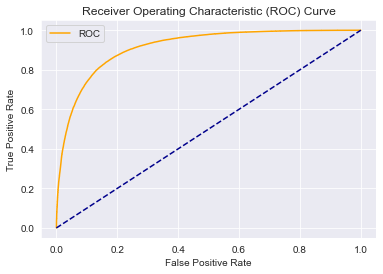

In [51]:

plot_roc_curve(fpr, tpr)#plotting ruc curve

#### USE BAGGING ON LOGISTIC REGRESSION MODEL

In [23]:
# Step:1 Create a logictice regression object for bagging
log_reg1 = LogisticRegression()

# Step:2 importing library

bagg = BaggingClassifier(base_estimator=log_reg1,n_estimators=50)
#base_estimator---> algorithm which you want to pass
#n_estimotors-----> number of base learners

# Step:3 fitting the Training data
bagg.fit(X_train,y_train)

# Step:4 prediction on test data
bagg_predict = bagg.predict(X_test)



#### EVALUATION

In [24]:
log_bagg_accuracy = accuracy_score(bagg_predict,y_test)
print("Testing accuracy of Logistic regession model after bagging",log_bagg_accuracy*100)
print("Logistic regression testing Classification report: \n",classification_report(bagg_predict,y_test))

Testing accuracy of Logistic regession model after bagging 83.62546552778343
Logistic regression testing Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.84      0.83     53117
           1       0.84      0.83      0.84     54825

    accuracy                           0.84    107942
   macro avg       0.84      0.84      0.84    107942
weighted avg       0.84      0.84      0.84    107942



In [25]:
bagg_f1_score = f1_score(bagg_predict,y_test)
bagg_f1_score*100

83.7499655232649

* After applying bagging score not improve 

### 2.ANN [MLP Classifier]

In [13]:
# Step:1 Importing library and object creation
model = MLPClassifier(hidden_layer_sizes=(60,3),
                      learning_rate='constant',
                      max_iter=100,
                      random_state=42)

In [14]:
# Step:2 Fitting the training data
model.fit(X_train,y_train)

MLPClassifier(hidden_layer_sizes=(60, 3), max_iter=100, random_state=42)

In [15]:
# Step:3 Predicting the probability
mlp_prdict_probability = model.predict_proba(X_test)
mlp_prdict_probability

array([[9.99967753e-01, 3.22470719e-05],
       [1.11112316e-01, 8.88887684e-01],
       [5.14673811e-04, 9.99485326e-01],
       ...,
       [5.60375931e-04, 9.99439624e-01],
       [9.82424802e-01, 1.75751976e-02],
       [9.99825336e-01, 1.74664001e-04]])

In [16]:
# Step:4 Prediction on test data
mlp_test_predict = model.predict(X_test)

# Step:5 Prediction on training data
mlp_train_predict = model.predict(X_train)

#### EVALUATION

#### TRAINING ACCURACY

In [17]:
mlp_train_accuracy = accuracy_score(mlp_train_predict,y_train)
print("Training accuracy of MLP model is:",mlp_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(mlp_train_predict,y_train))

Training accuracy of MLP model is: 93.81327870024062
Classification report of training:
               precision    recall  f1-score   support

           0       0.93      0.95      0.94    123204
           1       0.95      0.93      0.94    128658

    accuracy                           0.94    251862
   macro avg       0.94      0.94      0.94    251862
weighted avg       0.94      0.94      0.94    251862



* ANN MLP classifier model is very well work on training data

#### TESTING ACCURACY

In [18]:
mlp_test_accuracy = accuracy_score(mlp_test_predict,y_test)
print("Testing accuracy of MLP model is:",mlp_test_accuracy*100)
print("Classification report of testing:"'\n',classification_report(mlp_test_predict,y_test))

Testing accuracy of MLP model is: 90.45598562190807
Classification report of testing:
               precision    recall  f1-score   support

           0       0.89      0.92      0.90     52066
           1       0.92      0.89      0.91     55876

    accuracy                           0.90    107942
   macro avg       0.90      0.91      0.90    107942
weighted avg       0.91      0.90      0.90    107942



In [19]:
mlp_f1_score = f1_score(mlp_test_predict,y_test)
print('F1 Score',mlp_f1_score*100)

F1 Score 90.61919504643963


In [29]:
## checking cross validation score
scores = cross_val_score(model,X,y,cv=5,scoring='accuracy')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())
#std of < 0.05 is good.

[0.90185  0.901825 0.90295  0.90195  0.903325]
Cross validation Score: 0.90238
Std : 0.000631149744513941


* ANN MLP classifier model testing accuracy and cross val score is also good.

### 3.XGB Classifier

In [22]:
# Step:1 importing library and object creation
xgb = XGBClassifier()

# Step:2 fitting the training data
xgb.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [23]:
# Step:3 Prediction on training data
xgb_train_predict = xgb.predict(X_train)

# Step:4 Prediction on testing data
xgb_test_predict = xgb.predict(X_test)

#### EVALUATION 

#### TRAINING ACCURACY

In [24]:
xgb_train_accuracy = accuracy_score(xgb_train_predict,y_train)
print("Training accuracy XGB classifier:",xgb_train_accuracy*100)
print("Classification report of training:"'\n',classification_report(xgb_train_predict,y_train))

Training accuracy XGB classifier: 93.86052679642026
Classification report of training:
               precision    recall  f1-score   support

           0       0.94      0.94      0.94    125035
           1       0.94      0.94      0.94    126827

    accuracy                           0.94    251862
   macro avg       0.94      0.94      0.94    251862
weighted avg       0.94      0.94      0.94    251862



* XGB Classifier model also very well work on training data

#### TESTING ACCURACY

In [25]:
xgb_test_accuracy = accuracy_score(xgb_test_predict,y_test)
print("Testing accuracy XGB classifier:",xgb_test_accuracy*100)
print("Classification report of training:"'\n',classification_report(xgb_test_predict,y_test))

Testing accuracy XGB classifier: 90.74039762094458
Classification report of training:
               precision    recall  f1-score   support

           0       0.90      0.91      0.91     53271
           1       0.91      0.90      0.91     54671

    accuracy                           0.91    107942
   macro avg       0.91      0.91      0.91    107942
weighted avg       0.91      0.91      0.91    107942



In [27]:
xgb_f1_score = f1_score(xgb_test_predict,y_test)
print("F1 score of xgb:",xgb_f1_score*100)

F1 score of xgb: 90.6760806810451


In [27]:
## checking cross validation score dt1
scores = cross_val_score(xgb,X,y,cv=5,scoring='accuracy')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())
#std of < 0.05 is good.

[0.9231   0.9217   0.92265  0.921975 0.923175]
Cross validation Score: 0.9225199999999999
Std : 0.0005919037083850816


* XGB Classifier model accuracy score is also good.

### NOTE:
* FROM ABOVE XGBOOST AND MLP CLASSIFIER MODEL, WE TRIED HYPERPARAMETER TUNNING BUT THE DATA IS VERY HUGE IT TAKES MORE TIME TO FIT THE DATA ALSO WE ARE TRYIED ON GOOGLE COLAB AS WELL BUT NOT SOLVED.BECAUSE OF THE TIMINING PROBLEM  WE REMOVED ALL THE HYPERPARAMETER TUNING.

### CONCLUSIONS:
* Dimensionality reduction with outlier handled and standard scaling could not help us to build a better model.

* PCA with robust scaling gives better results.

* From EDA we are clearly see that most of the features  follow a normal distribution and some features are very close to the normal distribution so we do not needed to use feature transformation technique.

* From EDA we have seen the features are very close to the normal distribution as well as distance between points is very less so we are not imputed the outlier in second approach of feature engineering. we are used another scaling to robust the outlier.



* In  Logistic regression model training and testing score is not better after applying bagging. score is still lagging.

* ANN MLP Classifeir model is very well worked on training data as well as testing data. The score of training is 93.81 and testing score is 90.45 with f1 score is 90.61.Cross val score is 90.23

* XGB Classifier model is also well worked on training and testing side. The score of training 93.86 and testing score is 90.60 with f1 score is 90.74.Cross val score is 92.25.

* From above all models we are selected XGB model , and it gives a better result among all other models.Also the cross validation score for xgb model is better than ANN model.